In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0532.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0282.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1401.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0914.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0691.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0972.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0818.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0463.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0930.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1323.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1347.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1354.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0704.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications import VGG19
from torchvision import datasets
from collections import Counter
import warnings


# Tắt cảnh báo và log
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
tf.get_logger().setLevel('ERROR')
warnings.filterwarnings("ignore")

# Thiết lập seed
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)

# Tạo thư mục lưu kết quả
output_dir = '/kaggle/working/outputvgg19_improved'
os.makedirs(output_dir, exist_ok=True)
print(f"Thư mục {output_dir} đã được tạo.")

# Đường dẫn dữ liệu
train_data_dic = '/kaggle/input/brain-tumor-mri-dataset/Training'
test_data_dic = '/kaggle/input/brain-tumor-mri-dataset/Testing'

# Kiểm tra phân bố lớp
full_dataset = datasets.ImageFolder(root=train_data_dic)
class_names = full_dataset.classes
print(f"Danh sách lớp: {class_names}")
print(f"Số lớp: {len(class_names)}")

# Đếm số mẫu mỗi lớp
train_counts = Counter(full_dataset.targets)


# Tạo DataFrame cho tập train
imagePaths, labels = [], []
for folder in os.listdir(train_data_dic):
    folderPath = os.path.join(train_data_dic, folder)
    for image in os.listdir(folderPath):
        imagePaths.append(os.path.join(folderPath, image))
        labels.append(folder)

df = pd.DataFrame({'imagepaths': imagePaths, 'labels': labels})
train_df, valid_df = train_test_split(df, test_size=0.2, stratify=df['labels'], random_state=seed)

# Kiểm tra tập test
test_dataset = datasets.ImageFolder(root=test_data_dic)
test_counts = Counter(test_dataset.targets)

print(f"\n📊 Số ảnh train: {len(train_df)}")
print(f"📊 Số ảnh valid: {len(valid_df)}")
print(f"📊 Số ảnh test: {len(test_dataset)}")


2025-05-17 08:08:32.761166: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747469313.258855      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747469313.386044      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Thư mục /kaggle/working/outputvgg19_improved đã được tạo.
Danh sách lớp: ['glioma', 'meningioma', 'notumor', 'pituitary']
Số lớp: 4

📊 Số ảnh train: 4569
📊 Số ảnh valid: 1143
📊 Số ảnh test: 1311


Số lượng ảnh trong mỗi lớp của tập train:
glioma: 1057
meningioma: 1071
notumor: 1276
pituitary: 1165


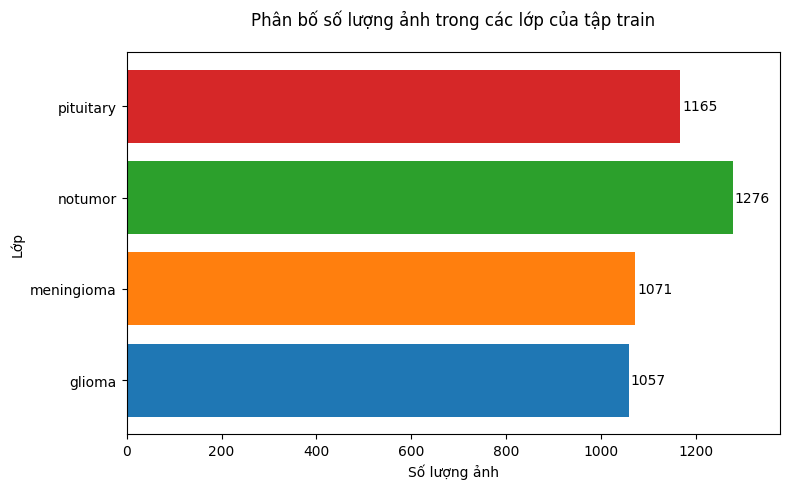

In [6]:
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

# Đếm số lượng ảnh trong mỗi lớp từ train_df
class_counts = Counter(train_df['labels'])
class_names = full_dataset.classes
counts = [class_counts[class_name] for class_name in class_names]

# In số lượng ảnh trong mỗi lớp
print("Số lượng ảnh trong mỗi lớp của tập train:")
for class_name, count in zip(class_names, counts):
    print(f"{class_name}: {count}")

# Tạo danh sách 4 màu khác nhau cho 4 lớp
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']  # Xanh dương, cam, xanh lá, đỏ

# Vẽ biểu đồ cột nằm
plt.figure(figsize=(8, 5))
bars = plt.barh(class_names, counts, color=colors)
plt.xlabel('Số lượng ảnh')
plt.ylabel('Lớp')
plt.title('Phân bố số lượng ảnh trong các lớp của tập train', loc='center', pad=20)

# Thêm số lượng cụ thể ở cuối mỗi cột
max_count = max(counts)
for bar, count in zip(bars, counts):
    width = bar.get_width()
    plt.text(width + 5, bar.get_y() + bar.get_height()/2, f'{count}', 
             ha='left', va='center', fontsize=10)

# Điều chỉnh giới hạn trục x để tạo thêm không gian cho số
plt.xlim(0, max_count + 100)  # Thêm khoảng trống 100 đơn vị bên phải

plt.tight_layout()


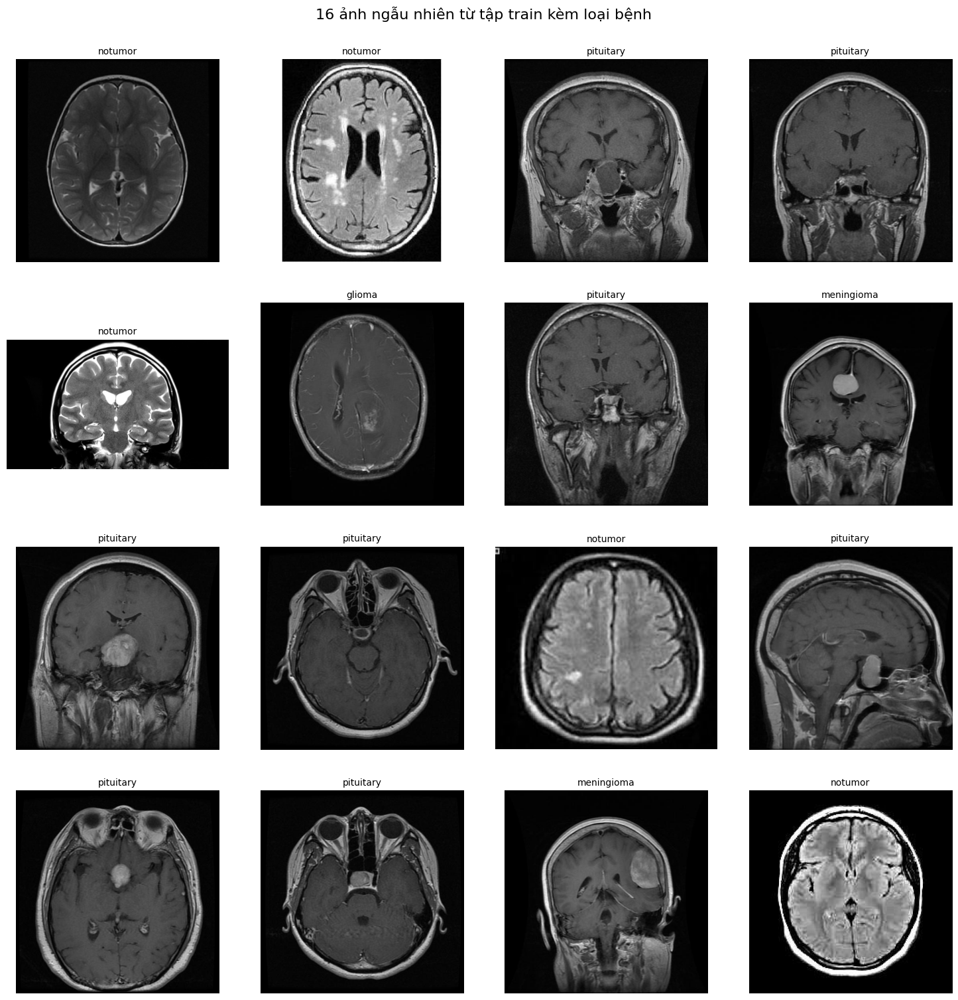

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Lấy danh sách lớp từ full_dataset
class_names = full_dataset.classes

# Lấy 16 mẫu ngẫu nhiên từ train_df
random_indices = random.sample(range(len(train_df)), 16)
random_samples = [(plt.imread(train_df['imagepaths'].iloc[i]), train_df['labels'].iloc[i]) for i in random_indices]

# Tạo lưới 4x4 với kích thước phù hợp
fig, axes = plt.subplots(4, 4, figsize=(16, 16))  # Tăng kích thước figure để ảnh rõ hơn
axes = axes.flatten()

# Hiển thị từng ảnh và tên loại bệnh
for i, (image, label) in enumerate(random_samples):
    # Kiểm tra số kênh của ảnh
    if len(image.shape) == 2 or (len(image.shape) == 3 and image.shape[2] == 1):
        # Ảnh grayscale
        axes[i].imshow(image, cmap='gray')
    else:
        # Ảnh RGB
        axes[i].imshow(image)
    axes[i].set_title(label, fontsize=10)  # Sử dụng label trực tiếp vì nó là tên lớp
    axes[i].axis('off')  # Tắt trục

# Điều chỉnh tiêu đề và layout
plt.suptitle('16 ảnh ngẫu nhiên từ tập train kèm loại bệnh', fontsize=16)
plt.subplots_adjust(left=0.05, right=0.95, top=0.93, bottom=0.05, wspace=0.1, hspace=0.2)  # Điều chỉnh khoảng cách giữa các subplot
plt.show()

In [4]:

# Tính class weights
class_counts = train_df['labels'].value_counts()
total_samples = len(train_df)
class_weights = {i: total_samples/(len(class_names) * class_counts[class_names[i]]) for i in range(len(class_names))}
print("\nClass weights:", class_weights)

# Thiết lập tham số
img_size = (224, 224)
batch_size = 32
img_shape = (224, 224, 3)
class_count = len(class_names)
epochs = 200

# Tăng cường dữ liệu
tr_gen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.3,
    height_shift_range=0.3,
    shear_range=0.2,
    zoom_range=0.3,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest',
    brightness_range=[0.7, 1.3]
)
ts_gen = ImageDataGenerator()

# Tạo generator
train_gen = tr_gen.flow_from_dataframe(
    train_df, x_col="imagepaths", y_col="labels", target_size=img_size,
    batch_size=batch_size, class_mode="categorical", color_mode='rgb', shuffle=True
)
valid_gen = ts_gen.flow_from_dataframe(
    valid_df, x_col="imagepaths", y_col="labels", target_size=img_size,
    batch_size=batch_size, class_mode="categorical", color_mode='rgb', shuffle=False
)
test_gen = ts_gen.flow_from_dataframe(
    pd.DataFrame({'imagepaths': [x[0] for x in test_dataset.imgs], 'labels': [class_names[x[1]] for x in test_dataset.imgs]}),
    x_col="imagepaths", y_col="labels", target_size=img_size,
    batch_size=batch_size, class_mode="categorical", color_mode='rgb', shuffle=False
)

# Xây dựng mô hình VGG19
base_model = VGG19(include_top=False, weights="imagenet", input_shape=img_shape, pooling='max')



Class weights: {0: 1.0806527909176915, 1: 1.0665266106442577, 2: 0.895180250783699, 3: 0.9804721030042919}
Found 4569 validated image filenames belonging to 4 classes.
Found 1143 validated image filenames belonging to 4 classes.
Found 1311 validated image filenames belonging to 4 classes.


I0000 00:00:1746366215.478016      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1746366215.478820      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [3]:

# Unfreeze 4 tầng cuối
for layer in base_model.layers[:-4]:
    layer.trainable = False
for layer in base_model.layers[-4:]:
    layer.trainable = True

model = Sequential([
    base_model,
    BatchNormalization(),
    Dense(256, activation='relu'),
    Dropout(rate=0.3, seed=seed),
    Dense(128, activation='relu'),
    Dropout(rate=0.3, seed=seed),
    Dense(class_count, activation='softmax')
])

# Biên dịch mô hình
model.compile(
    Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
model.summary()

# Callbacks
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=30,  # Đặt patience=30 theo yêu cầu
    restore_best_weights=True,
    verbose=1
)
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-6,
    verbose=1
)

# Huấn luyện mô hình
history = model.fit(
    train_gen, epochs=epochs, verbose=1, validation_data=valid_gen,
    class_weight=class_weights, callbacks=[early_stopping, reduce_lr]
)

# Lưu mô hình
model_path = os.path.join(output_dir, 'brain_tumor_model_vgg19_improved.keras')
model.save(model_path)
print(f"Mô hình đã được lưu tại {model_path}")

# Lưu lịch sử huấn luyện
history_df = pd.DataFrame(history.history)
history_csv_path = os.path.join(output_dir, 'training_history_vgg19_improved.csv')
history_df.to_csv(history_csv_path, index=False)
print(f"Lịch sử huấn luyện đã được lưu tại {history_csv_path}")




Class weights: {0: 1.0806527909176915, 1: 1.0665266106442577, 2: 0.895180250783699, 3: 0.9804721030042919}
Found 4569 validated image filenames belonging to 4 classes.
Found 1143 validated image filenames belonging to 4 classes.
Found 1311 validated image filenames belonging to 4 classes.


I0000 00:00:1746331271.394252      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1746331271.395031      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)                   │ (None, 512)                 │      20,024,384 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 4)                   │             516 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,191,172 (77.02 MB)

 Trainable params: 4,885,380 (18.64 MB)

 Non-trainable params: 15,305,792 (58.39 MB)

Epoch 1/200


I0000 00:00:1746331283.328449      97 service.cc:148] XLA service 0x7aefe8006260 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1746331283.329304      97 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1746331283.329328      97 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1746331283.857773      97 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1746331297.819309      97 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


143/143 ━━━━━━━━━━━━━━━━━━━━ 126s 726ms/step - accuracy: 0.6089 - loss: 0.9600 - val_accuracy: 0.7227 - val_loss: 0.8608 - learning_rate: 0.0010
Epoch 2/200
143/143 ━━━━━━━━━━━━━━━━━━━━ 72s 479ms/step - accuracy: 0.8424 - loss: 0.4465 - val_accuracy: 0.7629 - val_loss: 0.5352 - learning_rate: 0.0010
Epoch 3/200
143/143 ━━━━━━━━━━━━━━━━━━━━ 71s 475ms/step - accuracy: 0.8651 - loss: 0.3902 - val_accuracy: 0.9090 - val_loss: 0.3068 - learning_rate: 0.0010
Epoch 4/200
143/143 ━━━━━━━━━━━━━━━━━━━━ 71s 474ms/step - accuracy: 0.8816 - loss: 0.3437 - val_accuracy: 0.8644 - val_loss: 0.4025 - learning_rate: 0.0010
Epoch 5/200
143/143 ━━━━━━━━━━━━━━━━━━━━ 71s 474ms/step - accuracy: 0.8978 - loss: 0.2837 - val_accuracy: 0.9160 - val_loss: 0.2378 - learning_rate: 0.0010
Epoch 6/200
143/143 ━━━━━━━━━━━━━━━━━━━━ 71s 472ms/step - accuracy: 0.9056 - loss: 0.2791 - val_accuracy: 0.9256 - val_loss: 0.2053 - learning_rate: 0.0010
Epoch 7/200
143/143 ━━━━━━━━━━━━━━━━━━━━ 70s 469ms/step - accuracy: 0.9077 

Lịch sử huấn luyện đã được load từ /kaggle/working/outputvgg19_improved/training_history_vgg19_improved.csv


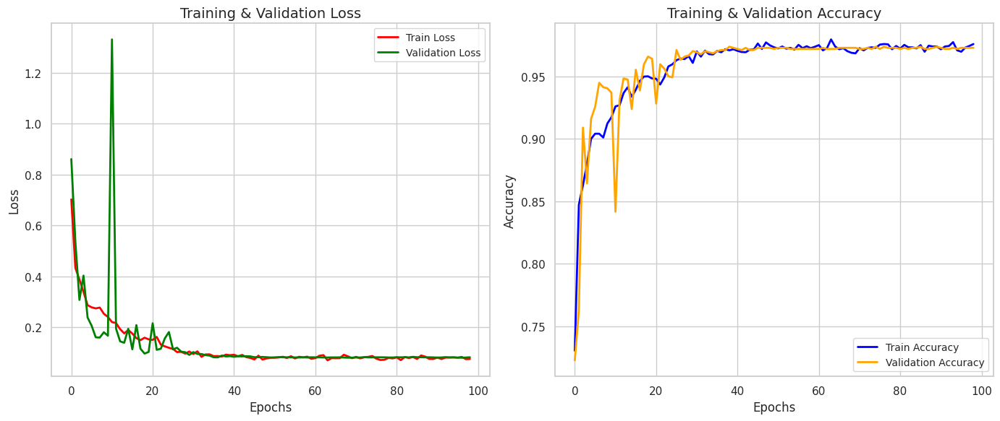

📈 Biểu đồ huấn luyện đã được lưu tại /kaggle/working/outputvgg19_improved/training_plots_improved.png


In [4]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
from tensorflow.keras.models import load_model

# Đảm bảo thư mục đầu ra tồn tại
save_dir = '/kaggle/working/outputvgg19_improved'
os.makedirs(save_dir, exist_ok=True)

# Load lịch sử huấn luyện từ file CSV
history_path = os.path.join(save_dir, 'training_history_vgg19_improved.csv')
history_df = pd.read_csv(history_path)
print(f"Lịch sử huấn luyện đã được load từ {history_path}")

# Chuyển đổi DataFrame thành định dạng giống history.history
history = {
    'accuracy': history_df['accuracy'].values,
    'val_accuracy': history_df['val_accuracy'].values,
    'loss': history_df['loss'].values,
    'val_loss': history_df['val_loss'].values
}

# Thiết lập style cho seaborn
sns.set(style="whitegrid")

# Vẽ đồ thị lịch sử huấn luyện
plt.figure(figsize=(14, 6))

# Biểu đồ Loss
plt.subplot(1, 2, 1)
plt.plot(history['loss'], label='Train Loss', color='red', linewidth=2)
plt.plot(history['val_loss'], label='Validation Loss', color='green', linewidth=2)
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('Training & Validation Loss', fontsize=14)
plt.legend(fontsize=10)
plt.grid(True)

# Biểu đồ Accuracy
plt.subplot(1, 2, 2)
plt.plot(history['accuracy'], label='Train Accuracy', color='blue', linewidth=2)
plt.plot(history['val_accuracy'], label='Validation Accuracy', color='orange', linewidth=2)
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('Training & Validation Accuracy', fontsize=14)
plt.legend(fontsize=10)
plt.grid(True)

# Tinh chỉnh layout và lưu biểu đồ
plt.tight_layout()
plot_path = os.path.join(save_dir, 'training_plots_improved.png')
plt.savefig(plot_path, dpi=300, bbox_inches='tight')
plt.show()
plt.close()
print(f"📈 Biểu đồ huấn luyện đã được lưu tại {plot_path}")

In [5]:
# Đánh giá trên tập test
test_loss, test_accuracy = model.evaluate(test_gen, verbose=1)
print(f"\nTest Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

41/41 ━━━━━━━━━━━━━━━━━━━━ 23s 561ms/step - accuracy: 0.9664 - loss: 0.0864

Test Loss: 0.0735
Test Accuracy: 0.9756


41/41 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step


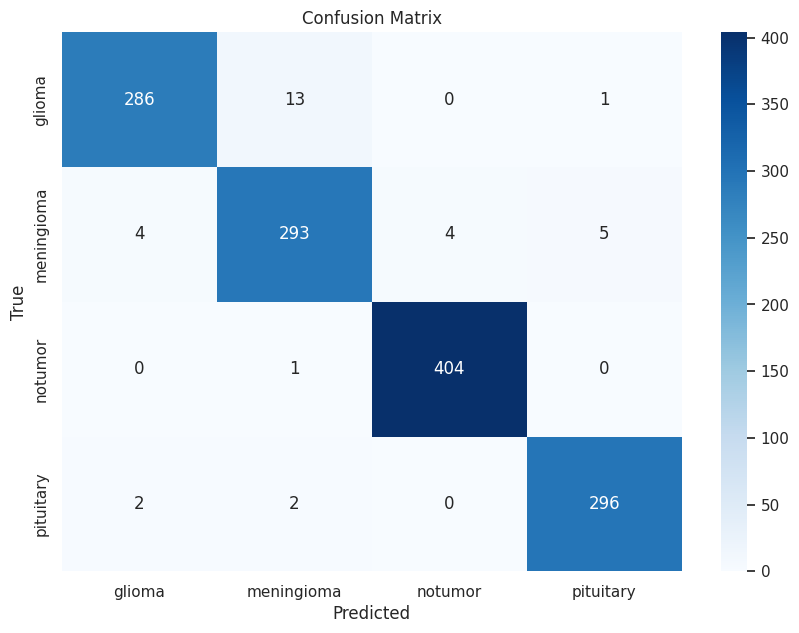

📊 Ma trận nhầm lẫn đã được lưu tại: /kaggle/working/outputvgg19_improved/confusion_matrix_improved.png

Classification Report:
              precision    recall  f1-score   support

      glioma       0.98      0.95      0.97       300
  meningioma       0.95      0.96      0.95       306
     notumor       0.99      1.00      0.99       405
   pituitary       0.98      0.99      0.98       300

    accuracy                           0.98      1311
   macro avg       0.97      0.97      0.97      1311
weighted avg       0.98      0.98      0.98      1311



In [6]:
# Ma trận nhầm lẫn và báo cáo phân loại
Y_pred = model.predict(test_gen, verbose=1)
predicted_classes = np.argmax(Y_pred, axis=1)
true_classes = test_gen.classes
cm = confusion_matrix(true_classes, predicted_classes)

# Lưu ma trận nhầm lẫn
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
cm_path = os.path.join(output_dir, 'confusion_matrix_improved.png')
plt.savefig(cm_path)
plt.show()
plt.close()
print(f"📊 Ma trận nhầm lẫn đã được lưu tại: {cm_path}")

# Báo cáo phân loại
print("\nClassification Report:")
print(classification_report(true_classes, predicted_classes, target_names=class_names))

In [7]:
# Tính mAP
from sklearn.metrics import average_precision_score
Y_true_one_hot = tf.keras.utils.to_categorical(true_classes, num_classes=class_count)
ap_scores = {}
for i, class_name in enumerate(class_names):
    ap = average_precision_score(Y_true_one_hot[:, i], Y_pred[:, i])
    ap_scores[class_name] = ap
    print(f"AP for class '{class_name}': {ap:.4f}")
mAP = np.mean(list(ap_scores.values()))
print(f"Mean Average Precision (mAP): {mAP:.4f}")

# Lưu kết quả mAP
result_path = os.path.join(output_dir, 'mAP_results_improved.txt')
with open(result_path, "w") as f:
    f.write(f"Mean Average Precision (mAP): {mAP:.4f}\n")
    f.write("\nAverage Precision per class:\n")
    for class_name, ap in ap_scores.items():
        f.write(f"{class_name}: {ap:.4f}\n")
    f.write(f"\nTest Accuracy: {test_accuracy:.4f}\n")
print(f"📊 Kết quả mAP đã được lưu tại: {result_path}")

AP for class 'glioma': 0.9962
AP for class 'meningioma': 0.9899
AP for class 'notumor': 0.9999
AP for class 'pituitary': 0.9967
Mean Average Precision (mAP): 0.9957
📊 Kết quả mAP đã được lưu tại: /kaggle/working/outputvgg19_improved/mAP_results_improved.txt


✅ Model loaded successfully from /kaggle/input/vgg19/keras/default/4/brain_tumor_model_vgg19_improved.keras
Found 1 validated image filenames.


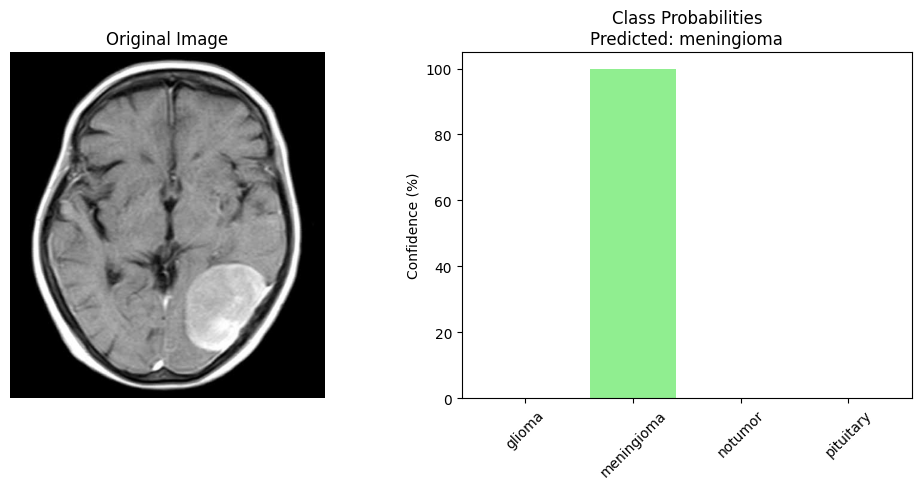


🔍 Prediction Results:
Image: Te-meTr_0004.jpg
Predicted Class: meningioma
Confidence: 100.00%

📊 Class Probabilities:
glioma: 0.00%
meningioma: 100.00%
notumor: 0.00%
pituitary: 0.00%


In [129]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from IPython.display import Image as DisplayImage, display
import pandas as pd

class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

output_dir = '/kaggle/working/outputvgg19'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f"Output directory {output_dir} created.")

img_size = (224, 224)
batch_size = 1  

test_gen = ImageDataGenerator()

def preprocess_image(image_path):
    """
    Preprocess an MRI image for VGG19 prediction.
    Returns the preprocessed image tensor and the original PIL image.
    """
    img = Image.open(image_path).convert('RGB')
    
    df = pd.DataFrame({'imagepaths': [image_path], 'labels': ['unknown']})
    
    # Create generator for the single image
    test_generator = test_gen.flow_from_dataframe(
        df,
        x_col="imagepaths",
        y_col=None, 
        target_size=img_size,
        batch_size=batch_size,
        class_mode=None, 
        color_mode='rgb',
        shuffle=False
    )
    
    preprocessed_img = next(test_generator)
    
    return preprocessed_img, img

def load_vgg19_model(model_path):
    """
    Load the trained VGG19 model.
    """
    try:
        model = load_model(model_path)
        print(f"✅ Model loaded successfully from {model_path}")
        return model
    except Exception as e:
        print(f"❌ Error loading model: {e}")
        raise

def predict_single_image(image_path, model):
    """
    Predict and visualize results for a single image.
    """
    preprocessed_img, original_img = preprocess_image(image_path)
    
    # Predict
    predictions = model.predict(preprocessed_img, verbose=0)
    predicted_class_idx = np.argmax(predictions[0])
    confidence = predictions[0][predicted_class_idx] * 100  # Convert to percentage
    predicted_class = class_labels[predicted_class_idx]
    class_probs = predictions[0] * 100  # Probabilities for all classes in percentage
    
    # Visualization
    plt.figure(figsize=(10, 5))
    
    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(np.array(original_img))
    plt.title('Original Image')
    plt.axis('off')
    
    # Class probabilities
    plt.subplot(1, 2, 2)
    colors = ['lightcoral' if i != predicted_class_idx else 'lightgreen' for i in range(len(class_labels))]
    plt.bar(class_labels, class_probs, color=colors)
    plt.title(f'Class Probabilities\nPredicted: {predicted_class}')
    plt.xticks(rotation=45)
    plt.ylabel('Confidence (%)')
    
    plt.tight_layout()
    output_path = os.path.join(output_dir, f"{os.path.basename(image_path).split('.')[0]}_result.png")
    plt.savefig(output_path)
    plt.show()
    
    print("\n🔍 Prediction Results:")
    print(f"Image: {os.path.basename(image_path)}")
    print(f"Predicted Class: {predicted_class}")
    print(f"Confidence: {confidence:.2f}%")
    print("\n📊 Class Probabilities:")
    for label, prob in zip(class_labels, class_probs):
        print(f"{label}: {prob:.2f}%")
    
    return predicted_class, confidence

def predict_batch(folder_path, model, num_samples=None):
    """
    Predict multiple images from a folder.
    """
    if not os.path.exists(folder_path):
        print(f"Error: Folder {folder_path} does not exist")
        return []
    
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    if num_samples:
        image_files = image_files[:num_samples]
    
    results = []
    print(f"\n🚀 Processing {len(image_files)} images...")
    
    for image_file in image_files:
        image_path = os.path.join(folder_path, image_file)
        predicted_label, confidence = predict_single_image(image_path, model)
        if predicted_label:
            results.append({
                'file': image_file,
                'prediction': predicted_label,
                'confidence': confidence
            })
        print("\n" + "="*50)
    
    # Save summary
    summary_path = os.path.join(output_dir, "batch_results_summary.txt")
    with open(summary_path, "w") as f:
        f.write("📊 Batch Prediction Summary:\n")
        f.write(f"Total images processed: {len(results)}\n\n")
        class_counts = {}
        for result in results:
            class_counts[result['prediction']] = class_counts.get(result['prediction'], 0) + 1
        f.write("Predicted Class Distribution:\n")
        for class_name, count in class_counts.items():
            percentage = (count / len(results)) * 100
            f.write(f"{class_name}: {count} images ({percentage:.1f}%)\n")
        if results:
            avg_confidence = sum(result['confidence'] for result in results) / len(results)
            f.write(f"\nAverage confidence: {avg_confidence:.2f}%\n")
        else:
            f.write("\nNo valid results to calculate average confidence\n")
    
    # Print summary
    print("\n📊 Batch Prediction Summary:")
    print(f"Total images processed: {len(results)}")
    if results:
        class_counts = {}
        for result in results:
            class_counts[result['prediction']] = class_counts.get(result['prediction'], 0) + 1
        print("\nPredicted Class Distribution:")
        for class_name, count in class_counts.items():
            percentage = (count / len(results)) * 100
            print(f"{class_name}: {count} images ({percentage:.1f}%)")
        avg_confidence = sum(result['confidence'] for result in results) / len(results)
        print(f"\nAverage confidence: {avg_confidence:.2f}%")
    else:
        print("No valid results to display")
    
    print(f"\n✅ Summary saved to: {summary_path}")
    return results

# Usage
if __name__ == "__main__":
    # Paths
    model_path = "/kaggle/input/vgg19/keras/default/4/brain_tumor_model_vgg19_improved.keras"
    image_path = "/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-meTr_0004.jpg"
    
    # Load model
    model = load_vgg19_model(model_path)
    # Predict single image
    result = predict_single_image(image_path, model)
    
    # Predict batch (uncomment to use)
    # folder_path = "/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary"
    # results = predict_batch(folder_path, model, num_samples=5)

✅ Model loaded successfully from /kaggle/input/vgg19/keras/default/1/brain_tumor_model_vgg19_improved.keras


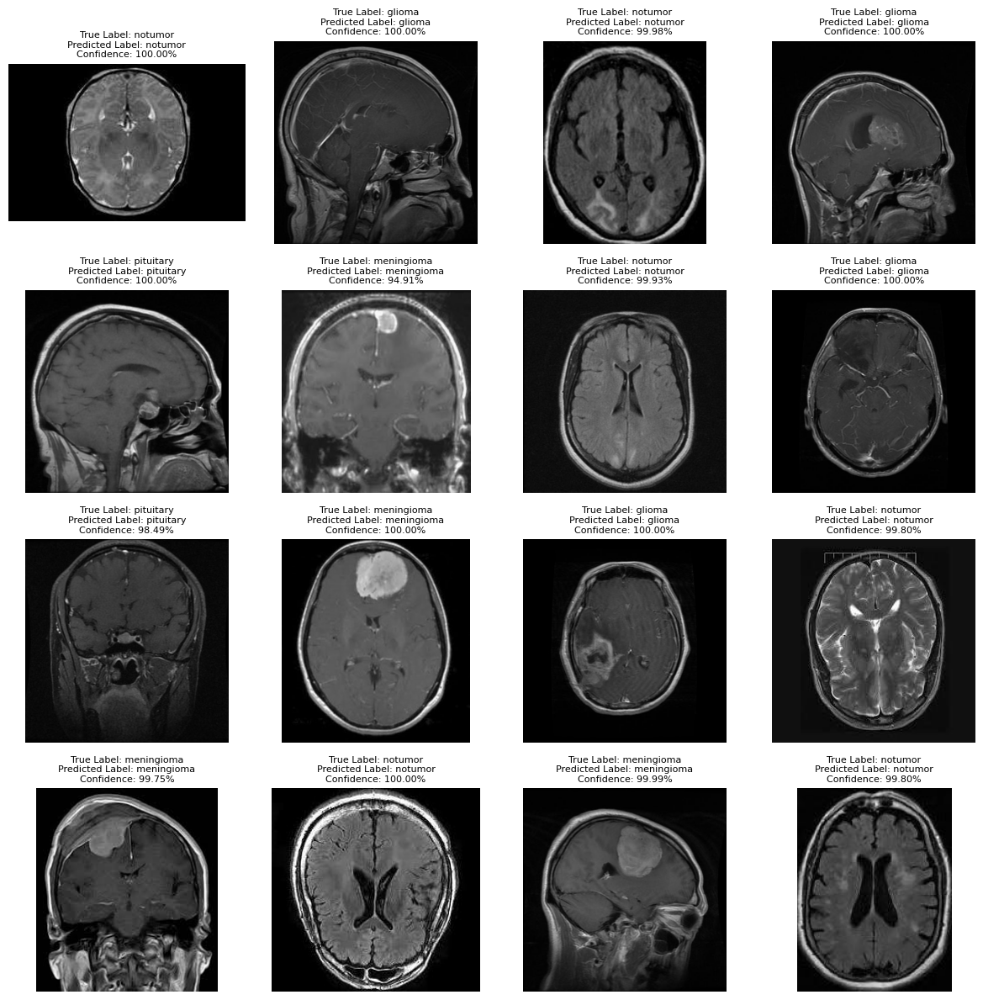

In [13]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
import random
from contextlib import redirect_stdout
from io import StringIO

# Suppress TensorFlow logs
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
tf.get_logger().setLevel('ERROR')

# Define class labels
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

# Image preprocessing parameters
img_size = (224, 224)
batch_size = 1  # Single image processing

# Create ImageDataGenerator for preprocessing (no preprocessing function, as per original)
test_gen = ImageDataGenerator()

def preprocess_image(image_path):
    """
    Preprocess an MRI image for VGG19 prediction.
    Returns the preprocessed image tensor and the original PIL image.
    """
    # Load and convert image
    img = Image.open(image_path).convert('RGB')
    
    # Create a single-image DataFrame for flow_from_dataframe
    df = pd.DataFrame({'imagepaths': [image_path], 'labels': ['unknown']})
    
    # Suppress output from flow_from_dataframe
    with redirect_stdout(StringIO()):
        test_generator = test_gen.flow_from_dataframe(
            df,
            x_col="imagepaths",
            y_col=None,  # No labels needed for prediction
            target_size=img_size,
            batch_size=batch_size,
            class_mode=None,  # No class mode for prediction
            color_mode='rgb',
            shuffle=False
        )
    
    # Get preprocessed image
    preprocessed_img = next(test_generator)
    
    return preprocessed_img, img

def load_vgg19_model(model_path):
    """
    Load the trained VGG19 model.
    """
    try:
        model = load_model(model_path)
        print(f"✅ Model loaded successfully from {model_path}")
        return model
    except Exception as e:
        print(f"❌ Error loading model: {e}")
        raise

def predict_single_image(image_path, true_label, model):
    """
    Predict the tumor class for a single image.
    Returns predicted class and confidence.
    """
    preprocessed_img, _ = preprocess_image(image_path)
    
    # Predict
    predictions = model.predict(preprocessed_img, verbose=0)
    predicted_class_idx = np.argmax(predictions[0])
    confidence = predictions[0][predicted_class_idx] * 100  # Convert to percentage
    predicted_class = class_labels[predicted_class_idx]
    
    return predicted_class, confidence

def display_random_16_images(test_dir, model):
    """
    Display 16 random images from the test directory with prediction results in titles.
    """
    # Collect all image paths and their true labels
    image_paths = []
    true_labels = []
    
    for class_name in class_labels:
        class_dir = os.path.join(test_dir, class_name)
        if not os.path.exists(class_dir):
            print(f"❌ Class directory not found: {class_dir}")
            continue
        for img_name in os.listdir(class_dir):
            if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_paths.append(os.path.join(class_dir, img_name))
                true_labels.append(class_name)
    
    # Randomly select 16 images
    if len(image_paths) < 16:
        print(f"⚠️ Only {len(image_paths)} images available, less than 16.")
        selected_indices = list(range(len(image_paths)))
    else:
        selected_indices = random.sample(range(len(image_paths)), 16)
    
    # Create 4x4 grid
    fig, axes = plt.subplots(4, 4, figsize=(12, 12))
    axes = axes.flatten()
    
    for idx, ax in zip(selected_indices, axes):
        image_path = image_paths[idx]
        true_label = true_labels[idx]
        
        predicted_label, confidence = predict_single_image(image_path, true_label, model)
        
        # Load and display image
        img = Image.open(image_path).convert('RGB')
        ax.imshow(img)
        ax.axis('off')
        
        # Set title with prediction details
        title = f"True Label: {true_label}\nPredicted Label: {predicted_label}\nConfidence: {confidence:.2f}%"
        ax.set_title(title, fontsize=8)
    
    plt.tight_layout()
    plt.show()

# Usage
if __name__ == "__main__":
    # Paths
    model_path = "/kaggle/input/vgg19/keras/default/1/brain_tumor_model_vgg19_improved.keras"
    test_dir = "/kaggle/input/brain-tumor-mri-dataset/Testing"
    
    # Load model
    model = load_vgg19_model(model_path)
    
    # Display 16 random images
    display_random_16_images(test_dir, model)

1 ẢNH

Found 1 validated image filenames.
Found 1 validated image filenames.
Found 1 validated image filenames.
Found 1 validated image filenames.
Found 1 validated image filenames.
Found 1 validated image filenames.
Found 1 validated image filenames.
Found 1 validated image filenames.


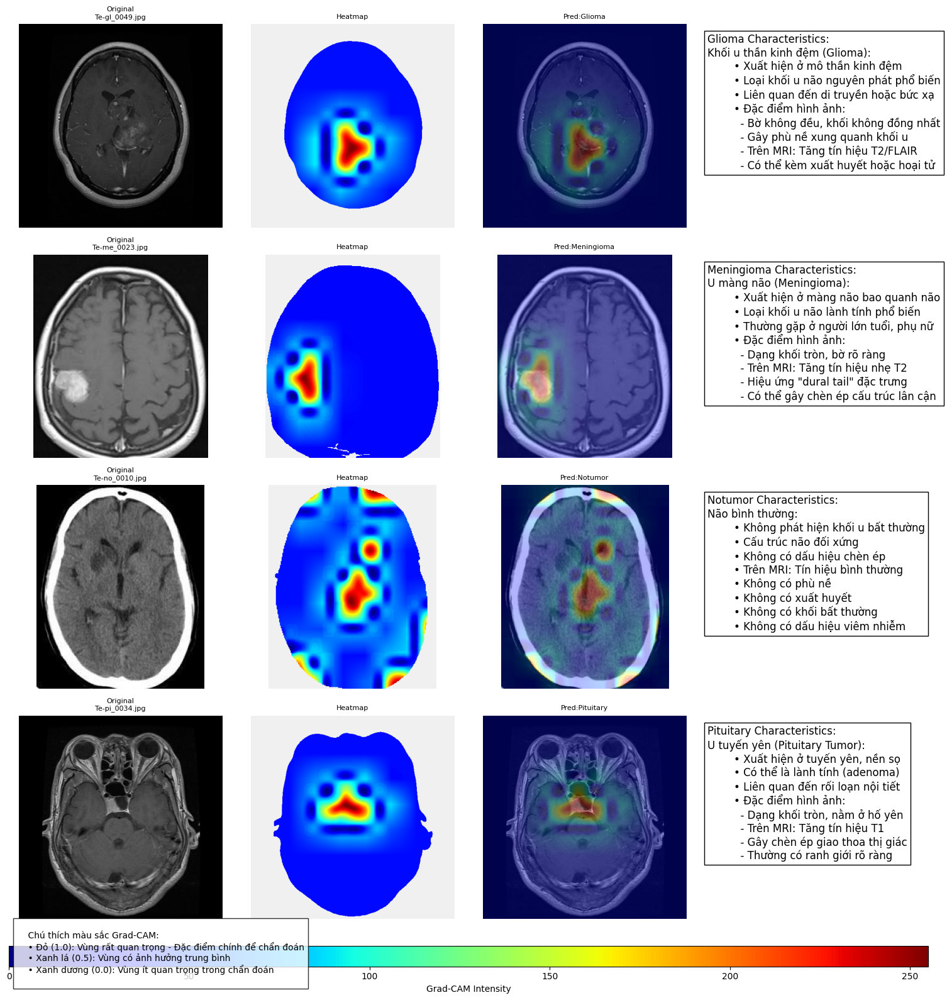

In [3]:
from matplotlib.gridspec import GridSpec
import matplotlib.pyplot as plt
import os
import numpy as np
from tensorflow.keras.models import load_model
from PIL import Image
import cv2
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import warnings

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
tf.get_logger().setLevel('ERROR')

# Define class labels
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

# Output directory
output_dir = './outputvgg19'
os.makedirs(output_dir, exist_ok=True)

# Image processing parameters
img_size = (224, 224)
batch_size = 1

# Create ImageDataGenerator for image processing
test_gen = ImageDataGenerator()

def get_brain_tumor_characteristics(tumor_type):
    """
    Trả về thông tin chi tiết về đặc điểm của từng loại khối u não, chuẩn hóa 9 dòng, bằng tiếng Việt.
    """
    characteristics = {
        'glioma': """
        Khối u thần kinh đệm (Glioma):
        • Xuất hiện ở mô thần kinh đệm
        • Loại khối u não nguyên phát phổ biến
        • Liên quan đến di truyền hoặc bức xạ
        • Đặc điểm hình ảnh:
          - Bờ không đều, khối không đồng nhất
          - Gây phù nề xung quanh khối u
          - Trên MRI: Tăng tín hiệu T2/FLAIR
          - Có thể kèm xuất huyết hoặc hoại tử
        """,

        'meningioma': """
        U màng não (Meningioma):
        • Xuất hiện ở màng não bao quanh não
        • Loại khối u não lành tính phổ biến
        • Thường gặp ở người lớn tuổi, phụ nữ
        • Đặc điểm hình ảnh:
          - Dạng khối tròn, bờ rõ ràng
          - Trên MRI: Tăng tín hiệu nhẹ T2
          - Hiệu ứng "dural tail" đặc trưng
          - Có thể gây chèn ép cấu trúc lân cận
        """,

        'notumor': """
        Não bình thường:
        • Không phát hiện khối u bất thường
        • Cấu trúc não đối xứng
        • Không có dấu hiệu chèn ép
        • Trên MRI: Tín hiệu bình thường
        • Không có phù nề
        • Không có xuất huyết
        • Không có khối bất thường
        • Không có dấu hiệu viêm nhiễm
        """,

        'pituitary': """
        U tuyến yên (Pituitary Tumor):
        • Xuất hiện ở tuyến yên, nền sọ
        • Có thể là lành tính (adenoma)
        • Liên quan đến rối loạn nội tiết
        • Đặc điểm hình ảnh:
          - Dạng khối tròn, nằm ở hố yên
          - Trên MRI: Tăng tín hiệu T1
          - Gây chèn ép giao thoa thị giác
          - Thường có ranh giới rõ ràng
        """
    }
    return characteristics.get(tumor_type, "Không có thông tin")

def preprocess_image(image_path):
    img = Image.open(image_path).convert('RGB')
    df = pd.DataFrame({'imagepaths': [image_path], 'labels': ['unknown']})
    test_generator = test_gen.flow_from_dataframe(
        df,
        x_col="imagepaths",
        y_col=None,
        target_size=img_size,
        batch_size=batch_size,
        class_mode=None,
        color_mode='rgb',
        shuffle=False
    )
    preprocessed_img = next(test_generator)
    return preprocessed_img, img

def load_vgg19_model(model_path):
    try:
        model = load_model(model_path)
        return model
    except Exception as e:
        raise Exception(f"Error loading model: {e}")

def predict_single_image(image_path, model):
    preprocessed_img, original_img = preprocess_image(image_path)
    predictions = model.predict(preprocessed_img, verbose=0)
    predicted_class_idx = np.argmax(predictions[0])
    confidence = predictions[0][predicted_class_idx] * 100
    predicted_class = class_labels[predicted_class_idx]
    return predicted_class, confidence, predicted_class_idx, predictions

def create_grad_model(model, predicted_class):
    target_layer = "block5_conv4"  # Use last conv layer for all classes
    try:
        vgg19_layer = model.get_layer('vgg19') if 'vgg19' in [layer.name for layer in model.layers] else model
        target_layer_output = vgg19_layer.get_layer(target_layer).output
        grad_model = tf.keras.models.Model(
            inputs=vgg19_layer.input,
            outputs=[target_layer_output, model(vgg19_layer.input)]
        )
        return grad_model
    except Exception as e:
        raise Exception(f"Error creating Grad-CAM model: {e}")

def generate_cam(grad_model, image_tensor, target_class):
    if len(image_tensor.shape) != 4 or image_tensor.shape[1:] != (224, 224, 3):
        raise ValueError(f"Invalid image_tensor shape: {image_tensor.shape}")
    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(image_tensor)
        loss = predictions[:, target_class]
    grads = tape.gradient(loss, conv_output)
    if grads is None:
        raise ValueError("Gradients are None")
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_output = conv_output[0]
    heatmap = tf.reduce_sum(conv_output * pooled_grads, axis=-1)
    heatmap = tf.nn.relu(heatmap).numpy()
    if heatmap.max() > 0:
        heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)
    else:
        heatmap = np.zeros_like(heatmap)
    heatmap = cv2.resize(heatmap, (224, 224), interpolation=cv2.INTER_CUBIC)
    return heatmap, predictions[0][target_class].numpy()

def create_head_mask(image, original_size):
    image_np = np.array(image.convert("L"))
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    image_enhanced = clahe.apply(image_np)
    _, binary = cv2.threshold(image_enhanced, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((3, 3), np.uint8)
    binary_cleaned = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel, iterations=1)
    binary_cleaned = cv2.morphologyEx(binary_cleaned, cv2.MORPH_OPEN, kernel, iterations=1)
    contours, _ = cv2.findContours(binary_cleaned, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask = np.zeros_like(image_np, dtype=np.uint8)
    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        cv2.drawContours(mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    else:
        mask = np.where(image_enhanced > 0, 255, 0).astype(np.uint8)
    mask = cv2.GaussianBlur(mask, (3, 3), 0)
    mask = np.where(mask > 30, 1.0, 0.0)
    mask = cv2.resize(mask, original_size, interpolation=cv2.INTER_NEAREST)
    return mask

def visualize_detection(image_path, model, background_color=(240, 240, 240)):
    predicted_class, confidence, predicted_class_idx, predictions = predict_single_image(image_path, model)
    preprocessed_img, original_img = preprocess_image(image_path)
    original_size = (original_img.width, original_img.height)
    head_mask = create_head_mask(original_img, original_size)
    head_mask_3c = np.stack([head_mask, head_mask, head_mask], axis=2)
    grad_model = create_grad_model(model, predicted_class)
    cam, cam_confidence = generate_cam(grad_model, preprocessed_img, predicted_class_idx)
    cam_resized = cv2.resize(cam, original_size, interpolation=cv2.INTER_CUBIC)
    cam_resized = cam_resized * head_mask  # Apply head mask
    if cam_resized.max() > 0:
        cam_resized = (cam_resized - cam_resized.min()) / (cam_resized.max() - cam_resized.min() + 1e-8)
    heatmap_uint8 = np.uint8(255 * cam_resized)
    heatmap_colored = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    heatmap_colored_rgb = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    bg_color_bgr = (background_color[2], background_color[1], background_color[0])
    background = np.ones((original_size[1], original_size[0], 3), dtype=np.uint8) * bg_color_bgr
    final_heatmap = np.where(head_mask_3c > 0.1, heatmap_colored_rgb, background)
    image_np = np.array(original_img)
    image_np = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
    alpha = 0.3
    heatmap_for_overlay = cv2.cvtColor(heatmap_colored_rgb, cv2.COLOR_RGB2BGR)
    overlay = cv2.addWeighted(image_np, 1-alpha, heatmap_for_overlay, alpha, 0)
    overlay_image_rgb = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    return {
        "original_image": original_img,
        "heatmap": final_heatmap,
        "overlay": overlay_image_rgb,
        "class_name": predicted_class,
        "confidence": confidence,
        "class_probs": predictions[0] * 100
    }

def detect_brain_tumor_4x4(model_path, image_paths):
    model = load_vgg19_model(model_path)
    results = [visualize_detection(image_path, model) for image_path in image_paths]
    
    # Create figure and GridSpec layout (4 rows for images + 1 row for colorbar)
    fig = plt.figure(figsize=(16, 20))  # Adjusted for 4 rows
    gs = GridSpec(5, 4, height_ratios=[1, 1, 1, 1, 0.1], figure=fig)  # 5 rows: 4 for images, 1 for colorbar
    
    # Process each image
    for i, (image_path, result) in enumerate(zip(image_paths, results)):
        # Plot original image
        ax0 = plt.subplot(gs[i, 0])
        ax0.imshow(result["original_image"])
        ax0.set_title(f"Ảnh gốc\n{os.path.basename(image_path)}", fontsize=10)
        ax0.axis("off")
        ax0.set_aspect('equal')
        for spine in ax0.spines.values():
            spine.set_visible(True)
            spine.set_color('black')
            spine.set_linewidth(1)
        
        # Plot heatmap
        ax1 = plt.subplot(gs[i, 1])
        im = ax1.imshow(result["heatmap"], cmap='jet')
        ax1.set_title("Bản đồ nhiệt Grad-CAM", fontsize=10)
        ax1.axis("off")
        ax1.set_aspect('equal')
        for spine in ax1.spines.values():
            spine.set_visible(True)
            spine.set_color('black')
            spine.set_linewidth(1)
        
        # Plot overlay
        ax2 = plt.subplot(gs[i, 2])
        ax2.imshow(result["overlay"])
        ax2.set_title(f"{result['class_name'].capitalize()}\n{result['confidence']:.2f}%", fontsize=10)
        ax2.axis("off")
        ax2.set_aspect('equal')
        for spine in ax2.spines.values():
            spine.set_visible(True)
            spine.set_color('black')
            spine.set_linewidth(1)
        
        # Plot characteristics
        ax3 = plt.subplot(gs[i, 3])
        tumor_type = result['class_name']
        characteristics = get_brain_tumor_characteristics(tumor_type)
        characteristics_text = f"Đặc điểm {tumor_type.capitalize()}:\n{characteristics.strip()}"
        ax3.text(0.01, 0.95, characteristics_text, fontsize=10, verticalalignment='top', 
                 bbox=dict(boxstyle='square', facecolor='white', edgecolor='black', linewidth=1))
        ax3.axis("off")
    
    # Add shared colorbar
    cbar_ax = plt.subplot(gs[4, :])
    plt.colorbar(im, cax=cbar_ax, orientation='horizontal', label='Cường độ Grad-CAM', cmap='jet')
    
    # Add Grad-CAM explanation in Vietnamese
    text_str = """
    Chú thích màu sắc Grad-CAM:
    • Đỏ (1.0): Vùng rất quan trọng - Đặc điểm chính để chẩn đoán
    • Xanh lá (0.5): Vùng có ảnh hưởng trung bình
    • Xanh dương (0.0): Vùng ít quan trọng trong chẩn đoán
    """
    plt.figtext(0.02, 0.02, text_str, fontsize=10, bbox=dict(facecolor='white', alpha=0.8))
    
    # Save the figure
    save_path = os.path.join(output_dir, "four_image_result.png")
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    # Save summaries for each image
    for i, (image_path, result) in enumerate(zip(image_paths, results)):
        summary_path = os.path.join(output_dir, f"result_summary_{i+1}.txt")
        with open(summary_path, "w") as f:
            f.write("📊 Tóm tắt dự đoán ảnh đơn:\n")
            f.write(f"\nẢnh: {os.path.basename(image_path)}\n")
            f.write(f"Lớp dự đoán: {result['class_name'].capitalize()}\n")
            f.write(f"Độ tin cậy: {result['confidence']:.2f}%\n")
            f.write(f"Đặc điểm:\n{get_brain_tumor_characteristics(result['class_name'])}\n")
    
    return results

if __name__ == "__main__":
    model_path = "/kaggle/input/vgg19_improved/keras/default/2/brain_tumor_model_vgg19.keras"
    image_paths = [
        "/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0049.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0023.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-no_0010.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-pi_0034.jpg"
    ]
    results = detect_brain_tumor_4x4(model_path, image_paths)

Found 1 validated image filenames.
Found 1 validated image filenames.


Tính toán Integrated Gradients (Te-gl_0028.jpg): 100%|██████████| 300/300 [00:17<00:00, 17.17it/s]

Found 1 validated image filenames.


Found 1 validated image filenames.


Tính toán Integrated Gradients (Te-me_0114.jpg): 100%|██████████| 300/300 [00:15<00:00, 19.33it/s]


Found 1 validated image filenames.
Found 1 validated image filenames.


Tính toán Integrated Gradients (Te-noTr_0009.jpg): 100%|██████████| 300/300 [00:15<00:00, 19.24it/s]

Found 1 validated image filenames.


Found 1 validated image filenames.


Tính toán Integrated Gradients (Te-pi_0041.jpg): 100%|██████████| 300/300 [00:15<00:00, 19.29it/s]


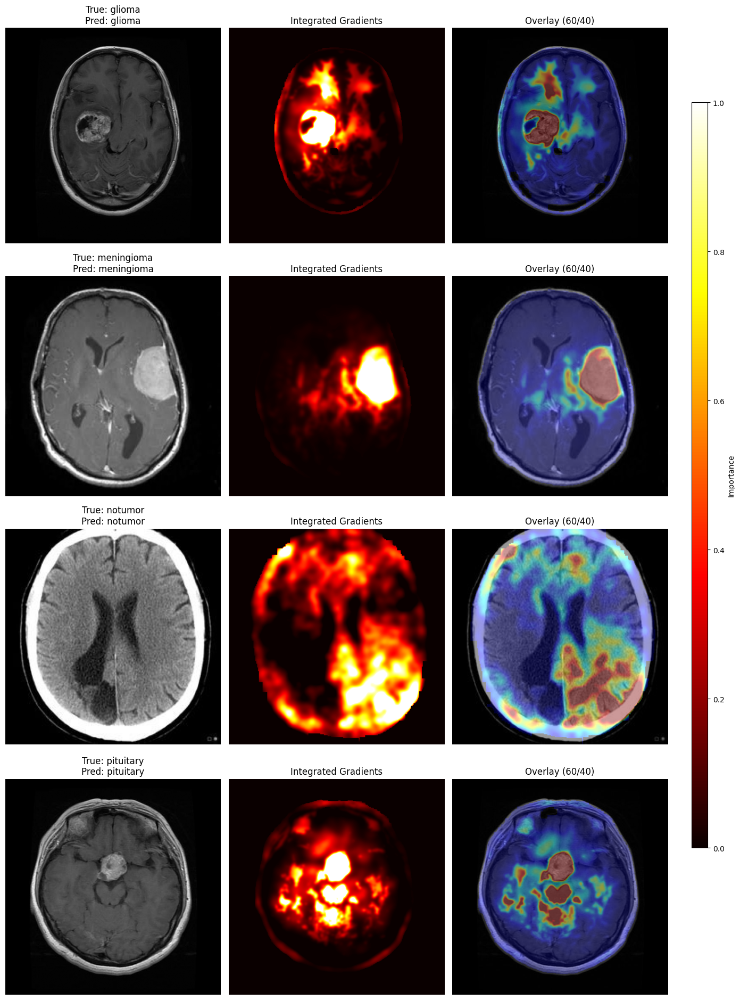

In [5]:
import os
import numpy as np
import tensorflow as tf
import cv2
from PIL import Image
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.vgg19 import preprocess_input
from scipy.ndimage import gaussian_filter
from tqdm import tqdm
import pandas as pd
import warnings

# Tắt cảnh báo để output sạch hơn
warnings.filterwarnings("ignore")
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
tf.get_logger().setLevel('ERROR')

# Định nghĩa nhãn lớp
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

# Thư mục đầu ra
output_dir = '/kaggle/working/outputvgg19'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Tham số xử lý ảnh
img_size = (224, 224)
batch_size = 1

# Khởi tạo ImageDataGenerator để tiền xử lý
test_gen = ImageDataGenerator()

# Hàm tiền xử lý ảnh
def preprocess_image(image_path):
    if not os.path.exists(image_path):
        return None, None, None
    try:
        img = Image.open(image_path).convert('RGB')
        df = pd.DataFrame({'imagepaths': [image_path], 'labels': ['unknown']})
        test_generator = test_gen.flow_from_dataframe(
            df,
            x_col="imagepaths",
            y_col=None,
            target_size=img_size,
            batch_size=batch_size,
            class_mode=None,
            color_mode='rgb',
            shuffle=False
        )
        preprocessed_img = next(test_generator)
        img_np = np.array(img)
        return img, preprocessed_img, img_np
    except Exception as e:
        return None, None, None

# Tải mô hình VGG19
def load_vgg19_model(model_path):
    try:
        model = load_model(model_path)
        return model
    except Exception as e:
        raise

# Hàm phân loại ảnh (không hiển thị)
def predict_single_image(image_path, model):
    img, preprocessed_img, img_np = preprocess_image(image_path)
    if img is None:
        return None, 0, None

    try:
        predictions = model.predict(preprocessed_img, verbose=0)
        predicted_class_idx = np.argmax(predictions[0])
        confidence = predictions[0][predicted_class_idx] * 100
        predicted_label = class_labels[predicted_class_idx]

        return predicted_label, confidence, predicted_class_idx
    except Exception as e:
        return None, 0, None

# Hàm phân đoạn não (điều chỉnh padding)
def segment_brain_region(image):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    _, thresh = cv2.threshold(gray, 10, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        mask = np.zeros_like(gray)
        cv2.drawContours(mask, [largest_contour], -1, 255, -1)
        x, y, w, h = cv2.boundingRect(largest_contour)
        # Tăng padding để bao quát toàn bộ vùng đầu
        padding = 20  # Tăng từ 5 lên 20
        x = max(0, x - padding)
        y = max(0, y - padding)
        w = min(gray.shape[1] - x, w + 2*padding)
        h = min(gray.shape[0] - y, h + 2*padding)
        if len(image.shape) == 3:
            return image[y:y+h, x:x+w], (x, y, w, h)
        return gray[y:y+h, x:x+w], (x, y, w, h)
    # Nếu không tìm thấy contour, giữ nguyên kích thước gốc
    return image, (0, 0, image.shape[1], image.shape[0])

# Các hàm phụ trợ cho Integrated Gradients
def create_brain_mask(brain_region, target_size):
    if len(brain_region.shape) == 3:
        gray = cv2.cvtColor(brain_region, cv2.COLOR_RGB2GRAY)
    else:
        gray = brain_region.copy()
    _, mask = cv2.threshold(gray, 10, 1, cv2.THRESH_BINARY)
    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    mask = cv2.erode(mask, kernel, iterations=2)
    mask = cv2.resize(mask, target_size, interpolation=cv2.INTER_NEAREST)
    return mask

def create_distance_penalty(shape, power=0.5, pituitary_focus=False):
    h, w = shape
    y, x = np.ogrid[:h, :w]
    if pituitary_focus:
        center_y, center_x = int(h * 0.5), w // 2
    else:
        center_y, center_x = h // 2, w // 2
    distance_from_center = np.sqrt((x - center_x)**2 + (y - center_y)**2)
    max_distance = np.sqrt((center_x)**2 + (center_y)**2)
    distance_penalty = 1 - (distance_from_center / max_distance)**power
    return distance_penalty

def enhance_brain_regions(image, threshold_percentile=85, sigma=3.0):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    gray = gray.astype(np.float32) / 255.0
    threshold = np.percentile(gray, threshold_percentile)
    bright_mask = (gray > threshold).astype(np.float32)
    bright_mask = gaussian_filter(bright_mask, sigma=sigma)
    bright_mask = (bright_mask - bright_mask.min()) / (bright_mask.max() - bright_mask.min() + 1e-8)
    return bright_mask

# Hàm Integrated Gradients
def integrated_gradients_visualization(image_path, model, pred_class, steps=300, sigma=3.0, only_brain=True):
    original_image, preprocessed_img, img_np = preprocess_image(image_path)
    if original_image is None:
        return None, None, None, None

    if only_brain:
        brain_region, bbox = segment_brain_region(img_np)
        brain_image = Image.fromarray(brain_region)
    else:
        brain_region = img_np
        brain_image = original_image

    # Sử dụng kích thước gốc của ảnh để resize
    target_size = (img_np.shape[1], img_np.shape[0])  # Kích thước gốc của img_np

    # Convert image to tensor
    img_tensor = tf.convert_to_tensor(preprocessed_img, dtype=tf.float32)

    def model_predict(inputs):
        return model(inputs, training=False)

    baseline = tf.zeros_like(img_tensor)
    integrated_grads = tf.zeros_like(img_tensor)
    for alpha in tqdm(np.linspace(0, 1, steps), desc=f"Tính toán Integrated Gradients ({os.path.basename(image_path)})"):
        alpha = tf.cast(alpha, tf.float32)
        interpolated_img = baseline + alpha * (img_tensor - baseline)
        with tf.GradientTape() as tape:
            tape.watch(interpolated_img)
            outputs = model_predict(interpolated_img)
            loss = outputs[:, pred_class]
        grads = tape.gradient(loss, interpolated_img)
        integrated_grads += grads / steps

    attribution = (img_tensor - baseline) * integrated_grads
    attribution = tf.reduce_sum(attribution, axis=-1).numpy().squeeze()
    attribution = gaussian_filter(np.abs(attribution), sigma=sigma)

    # Resize attribution về kích thước gốc của ảnh
    attribution = cv2.resize(attribution, target_size, interpolation=cv2.INTER_CUBIC)

    # Áp dụng mask với kích thước gốc
    brain_mask = create_brain_mask(img_np, target_size=target_size)
    attribution = attribution * brain_mask

    predicted_label = class_labels[pred_class]
    if predicted_label in ["glioma"]:
        bright_mask = enhance_brain_regions(img_np, threshold_percentile=85, sigma=3.0)
        bright_mask = cv2.resize(bright_mask, target_size, interpolation=cv2.INTER_NEAREST)
        attribution = attribution * (1 + 3.0 * bright_mask)
    elif predicted_label in ["meningioma", "pituitary"]:
        bright_mask = enhance_brain_regions(img_np, threshold_percentile=85, sigma=3.0)
        bright_mask = cv2.resize(bright_mask, target_size, interpolation=cv2.INTER_NEAREST)
        attribution = attribution * (1 + 3.0 * bright_mask)
        distance_penalty = create_distance_penalty(target_size[::-1], power=0.7, pituitary_focus=False)
        attribution = attribution * distance_penalty
    else:
        distance_penalty = create_distance_penalty(target_size[::-1], power=0.7, pituitary_focus=False)
        attribution = attribution * distance_penalty

    vmin, vmax = np.percentile(attribution[attribution > 0], [15, 95])
    attribution_norm = np.clip((attribution - vmin) / (vmax - vmin + 1e-8), 0, 1)
    attribution_norm = attribution_norm * brain_mask

    heatmap = cv2.applyColorMap(np.uint8(255 * attribution_norm), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0

    brain_np = img_np / 255.0  # Sử dụng img_np thay vì brain_region để giữ kích thước gốc
    overlay = 0.6 * brain_np + 0.4 * heatmap * np.expand_dims(brain_mask, axis=2)
    overlay = np.clip(overlay, 0, 1)

    return img_np, attribution_norm, overlay, predicted_label

# Hàm xử lý nhiều ảnh trong bố cục 4x3
def integrated_gradients_visualization_batch(image_paths, model, steps=300, sigma=3.0, save_dir=None):
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)

    # Tạo bố cục 4x3
    fig, axes = plt.subplots(4, 3, figsize=(15, 20))

    for idx, image_path in enumerate(image_paths):
        # Dự đoán lớp
        predicted_label, confidence, pred_class = predict_single_image(image_path, model)
        if predicted_label is None:
            for j in range(3):
                axes[idx, j].axis("off")
            continue

        # Tính Integrated Gradients
        brain_region, attribution_norm, overlay, pred_label_ig = integrated_gradients_visualization(
            image_path, model, pred_class, steps=steps, sigma=sigma, only_brain=True
        )

        if brain_region is None:
            for j in range(3):
                axes[idx, j].axis("off")
            continue

        # Lấy nhãn thực tế từ tên file
        label = os.path.basename(image_path).split('-')[1]
        if label.startswith("gl"):
            label = "glioma"
        elif label.startswith("me"):
            label = "meningioma"
        elif label.startswith("no"):
            label = "notumor"
        elif label.startswith("pi"):
            label = "pituitary"
        else:
            label = "unknown"

        # Brain Region
        axes[idx, 0].imshow(brain_region / 255.0)
        axes[idx, 0].set_title(f"True: {label}\nPred: {pred_label_ig}")
        axes[idx, 0].axis("off")

        # Integrated Gradients
        im = axes[idx, 1].imshow(attribution_norm, cmap="hot")
        axes[idx, 1].set_title("Integrated Gradients")
        axes[idx, 1].axis("off")

        # Overlay
        axes[idx, 2].imshow(overlay)
        axes[idx, 2].set_title("Overlay (60/40)")
        axes[idx, 2].axis("off")

    # Thêm colorbar chung cho tất cả heatmap
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.87, 0.15, 0.02, 0.7])
    plt.colorbar(im, cax=cbar_ax, label="Importance")

  

    plt.tight_layout(rect=[0, 0, 0.85, 0.95])
    if save_dir:
        save_path = os.path.join(save_dir, "integrated_gradients_batch_4x3.png")
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

# Usage
if __name__ == "__main__":
    # Paths
    model_path = "/kaggle/input/vgg19_improved/keras/default/2/brain_tumor_model_vgg19.keras"
    image_paths = [
        "/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0028.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0114.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-noTr_0009.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-pi_0041.jpg"
    ]

    # Load model
    model = load_vgg19_model(model_path)

    # Process batch of images
    integrated_gradients_visualization_batch(
        image_paths, 
        model, 
        steps=300, 
        save_dir=output_dir
    )

In [3]:
!pip install lime

Using device: GPU (2 devices)
Processing with VGG19...
VGG19 model loaded successfully from /kaggle/input/vgg19/keras/default/4/brain_tumor_model_vgg19_improved.keras!
Creating 4x4 LIME and Classification grid...

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0025.jpg
Image loaded successfully: (512, 512, 3)
Segmentation done: 100 segments
Running LIME explanation...


  0%|          | 0/1500 [00:00<?, ?it/s]

LIME explanation completed!

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0030.jpg
Image loaded successfully: (303, 252, 3)
Segmentation done: 106 segments
Running LIME explanation...


  0%|          | 0/1500 [00:00<?, ?it/s]

LIME explanation completed!

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-no_0016.jpg
Image loaded successfully: (218, 236, 3)
Segmentation done: 95 segments
Running LIME explanation...


  0%|          | 0/1500 [00:00<?, ?it/s]

LIME explanation completed!

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-piTr_0008.jpg
Image loaded successfully: (512, 512, 3)
Segmentation done: 108 segments
Running LIME explanation...


  0%|          | 0/1500 [00:00<?, ?it/s]

LIME explanation completed!

Grid saved to /kaggle/working/outputvgg19_improved/vgg19_lime_4x4_grid.png


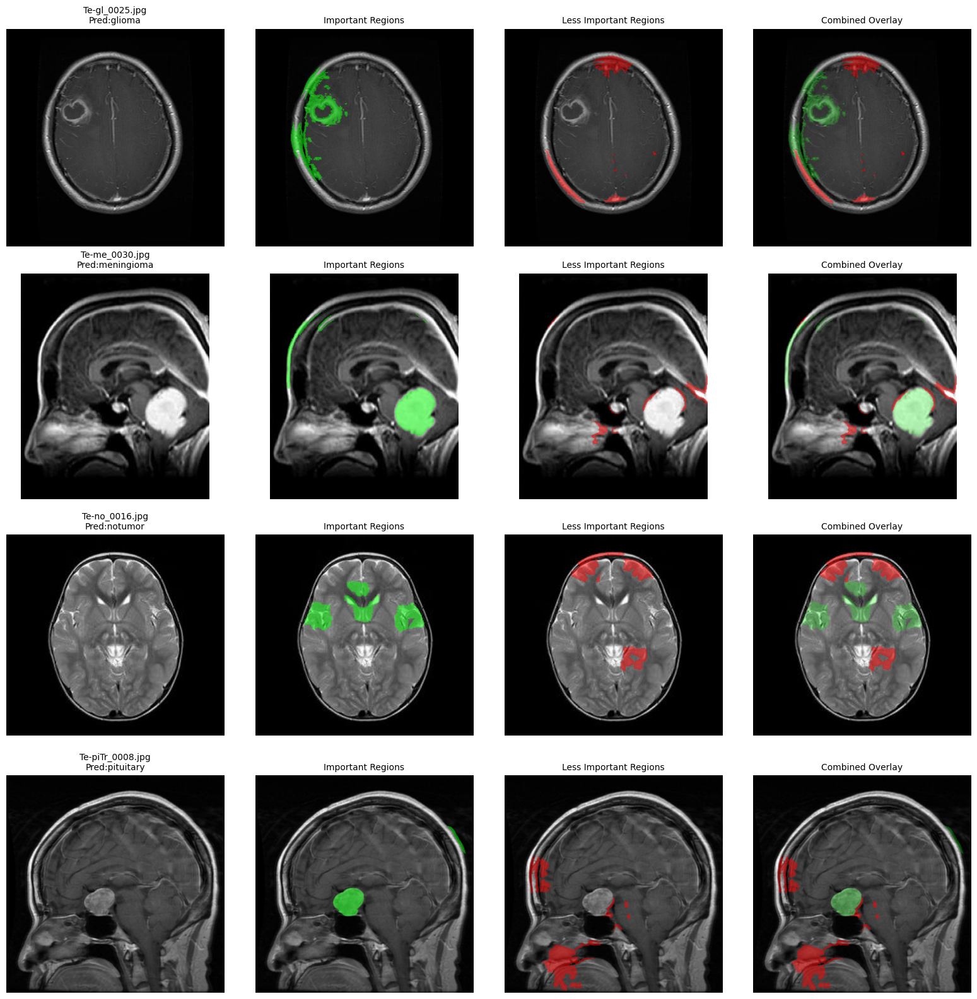

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from lime import lime_image
from skimage.segmentation import slic
import cv2
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.vgg19 import preprocess_input
import os
import IPython.display as display

# Fix GPU memory growth
physical_devices = tf.config.list_physical_devices('GPU')
if physical_devices:
    try:
        for gpu in physical_devices:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"Using device: GPU ({len(physical_devices)} devices)")
    except RuntimeError as e:
        print(f"GPU configuration error: {e}")
else:
    print("Using device: CPU")

# Create output directory
save_dir = "./outputvgg19_improved"  # Adjusted for local execution; change as needed
os.makedirs(save_dir, exist_ok=True)

# Class labels
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

# Initialize VGG19 model
def initialize_vgg19_model(model_path):
    if not os.path.exists(model_path):
        print(f"Error: Model file not found at {model_path}. Exiting.")
        return None
    try:
        model = load_model(model_path)
        print(f"VGG19 model loaded successfully from {model_path}!")
        return model
    except Exception as e:
        print(f"Error loading VGG19 model: {e}")
        return None

# Preprocess for classification
def preprocess_image(image_path):
    if not os.path.exists(image_path):
        print(f"Error: File {image_path} does not exist")
        return None, None
    try:
        image = Image.open(image_path).convert("RGB")
        image = image.resize((224, 224))
        img_array = np.array(image)
        img_array = preprocess_input(img_array)
        img_array = np.expand_dims(img_array, axis=0)
        return image, img_array
    except Exception as e:
        print(f"Error loading image {image_path}: {str(e)}")
        return None, None

def predict_single_image(image_path, model):
    image, img_array = preprocess_image(image_path)
    if image is None or img_array is None or model is None:
        return None, 0, None
    try:
        probs = model.predict(img_array, verbose=0)
        predicted_class = np.argmax(probs, axis=1)[0]
        confidence = probs[0][predicted_class] * 100
        predicted_label = class_labels[predicted_class]
        result_path = os.path.join(save_dir, f"{os.path.basename(image_path).split('.')[0]}_classify_result.jpg")
        plt.figure(figsize=(10, 5))
        image_cv2 = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
        plt.subplot(1, 2, 1)
        plt.imshow(image_cv2)
        plt.title('Original Image')
        plt.axis('off')
        plt.subplot(1, 2, 2)
        class_probs = probs[0] * 100
        colors = ['lightcoral' if i != predicted_class else 'lightgreen' for i in range(len(class_labels))]
        plt.bar(class_labels, class_probs, color=colors)
        plt.title(f'Class Probabilities\nPredicted: {predicted_label}')
        plt.xticks(rotation=45)
        plt.ylabel('Confidence (%)')
        plt.tight_layout()
        plt.savefig(result_path)
        plt.close()
        return predicted_label, confidence, image
    except Exception as e:
        print(f"Error processing image {image_path}: {str(e)}")
        return None, 0, None

# Batch prediction for LIME
def batch_predict(images, model):
    processed_images = np.array([preprocess_input(img) for img in images])
    probs = model.predict(processed_images, verbose=0)
    return probs

# Image segmentation for LIME
def segment_image(image, n_segments=80, compactness=30):
    segments = slic(image, n_segments=n_segments, compactness=compactness, sigma=1.0, start_label=1,
                    enforce_connectivity=True, min_size_factor=0.02)
    return segments

# LIME explanation function without thresholding
def explain_with_lime_for_vgg19(image_path, pred_class, model, num_samples=1500):
    if not os.path.exists(image_path):
        print(f"Error: Image file not found at {image_path}")
        return None, None, None
    try:
        img = Image.open(image_path).convert("RGB")
        img_np = np.array(img)
        print(f"Image loaded successfully: {img_np.shape}")
        segments = segment_image(img_np, n_segments=80, compactness=30)
        print(f"Segmentation done: {len(np.unique(segments))} segments")
        explainer = lime_image.LimeImageExplainer()
        print("Running LIME explanation...")
        top_label = class_labels.index(pred_class)
        explanation = explainer.explain_instance(
            img_np,
            lambda x: batch_predict(x, model),
            segmentation_fn=lambda x: segments,
            top_labels=None,
            labels=(top_label,),
            hide_color=0,
            num_samples=num_samples
        )
        print("LIME explanation completed!")
        # Get raw importance scores
        segment_importance = explanation.local_exp[top_label]
        importance_map = np.zeros(segments.shape)
        for segment_id, weight in segment_importance:
            importance_map[segments == segment_id] = weight
        # Positive regions (contributing to prediction)
        positive_regions = np.copy(img_np)
        positive_mask = (importance_map > 0).astype(np.uint8) * 255
        positive_regions = cv2.bitwise_and(positive_regions, positive_regions, mask=positive_mask)
        for c in range(3):
            positive_regions[:, :, c] = np.where(
                positive_mask > 0,
                (0.5 * np.array([0, 255, 0])[c] + 0.5 * img_np[:, :, c]).astype(np.uint8),
                img_np[:, :, c]
            )
        # Negative regions (detracting from prediction)
        negative_regions = np.copy(img_np)
        negative_mask = (importance_map < 0).astype(np.uint8) * 255
        negative_regions = cv2.bitwise_and(negative_regions, negative_regions, mask=negative_mask)
        for c in range(3):
            negative_regions[:, :, c] = np.where(
                negative_mask > 0,
                (0.5 * np.array([255, 0, 0])[c] + 0.5 * img_np[:, :, c]).astype(np.uint8),
                img_np[:, :, c]
            )
        return img_np, positive_regions, negative_regions
    except Exception as e:
        print(f"Error during LIME explanation for {image_path}: {e}")
        return None, None, None

# Create 4x4 grid with classification and LIME
def create_4x4_grid(image_paths, model):
    fig, axes = plt.subplots(4, 4, figsize=(16, 16))
    plt.tight_layout(pad=1.0, w_pad=0.5, h_pad=0.5)
    for row, image_path in enumerate(image_paths):
        print(f"\nProcessing image: {image_path}")
        pred_label, pred_confidence, image = predict_single_image(image_path, model)
        if pred_label is None:
            print(f"Skipping {image_path} due to classification error.")
            for col in range(4):
                axes[row, col].axis("off")
                axes[row, col].text(0.5, 0.5, "Error", ha="center", va="center", fontsize=12)
            continue
        img_np, positive_regions, negative_regions = explain_with_lime_for_vgg19(
            image_path, pred_class=pred_label, model=model, num_samples=1500
        )
        if img_np is None:
            print(f"Skipping {image_path} due to LIME error.")
            for col in range(4):
                axes[row, col].axis("off")
                axes[row, col].text(0.5, 0.5, "Error", ha="center", va="center", fontsize=12)
            continue
        axes[row, 0].imshow(img_np)
        axes[row, 0].set_title(f"{os.path.basename(image_path)}\nPred:{pred_label}", fontsize=10)
        axes[row, 0].axis("off")
        axes[row, 1].imshow(positive_regions)
        axes[row, 1].set_title("Positive Regions (LIME)", fontsize=10)
        axes[row, 1].axis("off")
        axes[row, 2].imshow(negative_regions)
        axes[row, 2].set_title("Negative Regions (LIME)", fontsize=10)
        axes[row, 2].axis("off")
        combined_image = np.copy(img_np)
        positive_mask = (positive_regions.sum(axis=2) > 0).astype(np.uint8) * 255
        negative_mask = (negative_regions.sum(axis=2) > 0).astype(np.uint8) * 255
        for c in range(3):
            combined_image[:, :, c] = np.where(
                positive_mask > 0,
                (0.5 * positive_regions[:, :, c] + 0.5 * img_np[:, :, c]).astype(np.uint8),
                combined_image[:, :, c]
            )
            combined_image[:, :, c] = np.where(
                negative_mask > 0,
                (0.5 * negative_regions[:, :, c] + 0.5 * combined_image[:, :, c]).astype(np.uint8),
                combined_image[:, :, c]
            )
        axes[row, 3].imshow(combined_image)
        axes[row, 3].set_title("Combined Overlay", fontsize=10)
        axes[row, 3].axis("off")
    result_path = os.path.join(save_dir, "vgg19_lime_4x4_grid.png")
    plt.savefig(result_path, bbox_inches="tight")
    plt.close()
    print(f"\nGrid saved to {result_path}")
    try:
        display.display(display.Image(result_path))
    except Exception as e:
        print(f"Error displaying image: {e}")

# Main execution
if __name__ == "__main__":
    print("Processing with VGG19...")
    model_path = "./brain_tumor_model_vgg19_improved.keras"  # Adjust path as needed
    model = initialize_vgg19_model(model_path)
    if model is None:
        print("Exiting due to model loading failure.")
        exit(1)
    
    # Run LIME 4x4 grid
    print("Creating 4x4 LIME and Classification grid...")
    lime_image_paths = [
        "./Te-gl_0025.jpg",  # Adjust paths to local files
        "./Te-me_0030.jpg",
        "./Te-no_0016.jpg",
        "./Te-piTr_0008.jpg"
    ]
    for path in lime_image_paths:
        if not os.path.exists(path):
            print(f"Warning: Image not found at {path}")
    create_4x4_grid(lime_image_paths, model)

2025-05-25 20:00:34.370366: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748203234.601555      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748203234.673423      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Using GPU


I0000 00:00:1748203254.519958      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1748203254.520677      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


✅ Mô hình đã được tải thành công từ /kaggle/input/vgg19/keras/default/4/brain_tumor_model_vgg19_improved.keras


I0000 00:00:1748203257.451306      99 service.cc:148] XLA service 0x7fa0c8005330 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1748203257.452007      99 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1748203257.452027      99 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1748203257.626903      99 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1748203259.994293      99 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [10:12, 612.99s/it]              
divide by zero encountered in divide
divide by zero encountered in divide
divide by zero encountered in divide
divide by zero encountered in divide


Shape giá trị SHAP: (1, 224, 224, 3, 4)
Đã điều chỉnh shape giá trị SHAP: (1, 224, 224, 4)
Tổng giá trị SHAP tích cực: 1.0479928878310658
Tổng giá trị SHAP tiêu cực: 0.49524927572813293


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [10:48, 648.40s/it]              


Shape giá trị SHAP: (1, 224, 224, 3, 4)
Đã điều chỉnh shape giá trị SHAP: (1, 224, 224, 4)
Tổng giá trị SHAP tích cực: 0.7745513949806695
Tổng giá trị SHAP tiêu cực: 0.09023740973815603


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [10:36, 636.23s/it]              


Shape giá trị SHAP: (1, 224, 224, 3, 4)
Đã điều chỉnh shape giá trị SHAP: (1, 224, 224, 4)
Tổng giá trị SHAP tích cực: 0.996276072867113
Tổng giá trị SHAP tiêu cực: 0.5846324399644421


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [10:15, 615.44s/it]              


Shape giá trị SHAP: (1, 224, 224, 3, 4)
Đã điều chỉnh shape giá trị SHAP: (1, 224, 224, 4)
Tổng giá trị SHAP tích cực: 0.796757652763017
Tổng giá trị SHAP tiêu cực: 0.1251683660405504


This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


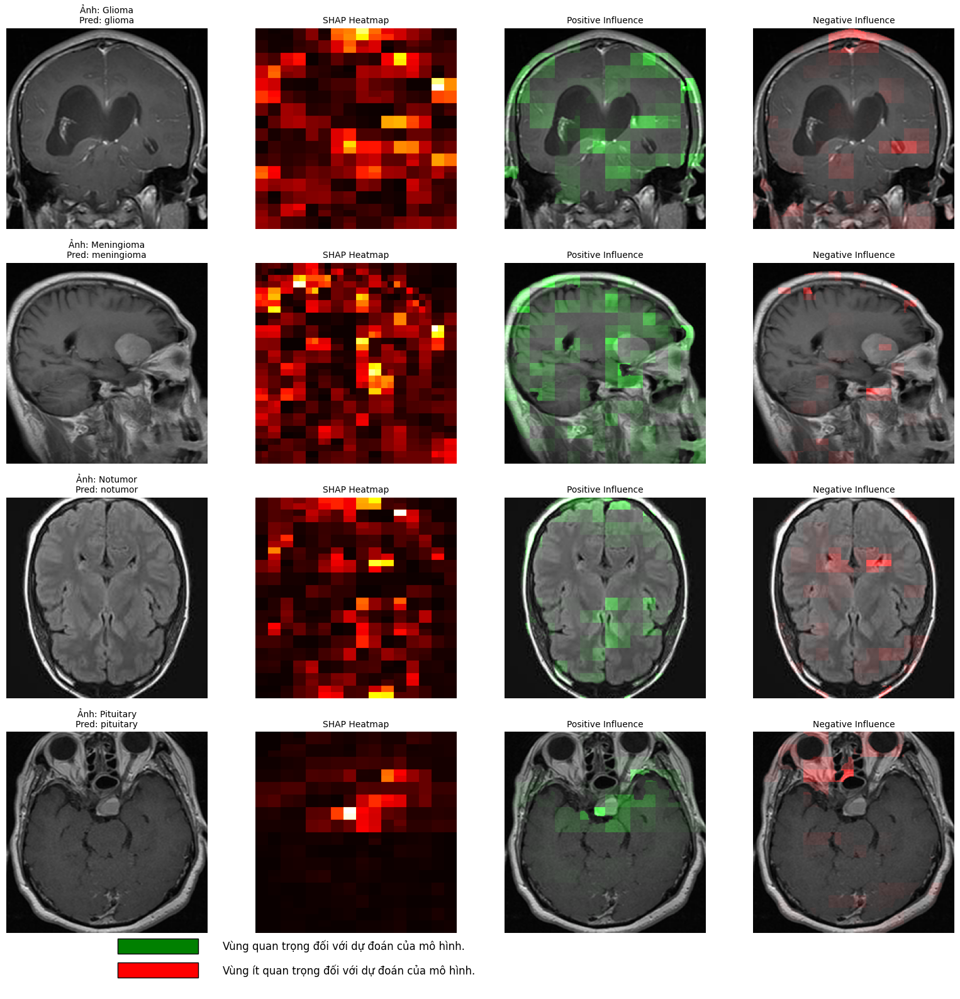

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import tensorflow as tf
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from skimage.segmentation import slic
from skimage.color import label2rgb
import shap
import matplotlib.patches as patches

# Thiết lập thiết bị
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("Using GPU")
    except RuntimeError as e:
        print(e)
else:
    print("Using CPU")

# Tạo thư mục lưu kết quả
save_dir = "/content/drive/MyDrive/Colab Notebooks/chatluongcao/vgg19/results"
os.makedirs(save_dir, exist_ok=True)

# Định nghĩa nhãn lớp khối u não
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]
num_classes = len(class_labels)

# Load mô hình VGG19
def load_vgg19_model(model_path=None):
    if model_path and os.path.exists(model_path):
        try:
            model = load_model(model_path)
            print("✅ Mô hình đã được tải thành công từ", model_path)
            return model
        except Exception as e:
            print(f"❌ Lỗi khi tải mô hình: {e}")
            print("⚠️ Falling back to VGG19 with ImageNet weights.")
    
    # Fallback: Create VGG19 with ImageNet weights
    base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.3)(x)
    x = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=x)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    print("⚠️ Using VGG19 with ImageNet weights. Fine-tuning may be required.")
    return model

# Hàm cắt rìa ảnh (tương tự ViT)
def crop_image(img_array, margin=20):
    """Cắt bỏ rìa ảnh để loại bỏ vùng không liên quan."""
    height, width = img_array.shape[:2]
    return img_array[margin:height-margin, margin:width-margin]

# Hàm tiền xử lý ảnh (áp dụng cách xử lý của ViT)
def preprocess_image(image_path, predicted_label=None):
    if not os.path.exists(image_path):
        print(f"Error: File {image_path} does not exist")
        return None, None, None
    try:
        image = Image.open(image_path).convert("RGB")
        # Resize về 224x224 trước khi cắt
        image = image.resize((224, 224), Image.LANCZOS)
        img_array = np.array(image)
        # Điều chỉnh margin dựa trên nhãn dự đoán (tương tự ViT)
        margin = 35 if predicted_label == "glioma" else 20
        # Cắt rìa
        img_array = crop_image(img_array, margin=margin)
        image = Image.fromarray(img_array)
        # Đảm bảo kích thước cuối cùng là 224x224 sau khi cắt
        image = image.resize((224, 224), Image.LANCZOS)
        img_array = np.array(image)
        # Preprocess cho VGG19 (theo chuẩn ImageNet)
        input_tensor = preprocess_input(img_array[np.newaxis, ...])
        return image, input_tensor, img_array
    except Exception as e:
        print(f"Error loading image {image_path}: {str(e)}")
        return None, None, None

# Hàm dự đoán
def predict_single_image(image_path, model):
    image, input_tensor, _ = preprocess_image(image_path)
    if image is None or input_tensor is None:
        return None, 0

    try:
        probs = model.predict(input_tensor, verbose=0)[0]
        predicted_class = np.argmax(probs)
        confidence = probs[predicted_class] * 100
        predicted_label = class_labels[predicted_class]
        return predicted_label, confidence
    except Exception as e:
        print(f"Error processing image {image_path}: {str(e)}")
        return None, 0

# Wrapper cho mô hình VGG19
class VGG19Wrapper:
    def __init__(self, model, num_classes):
        self.model = model
        self.num_classes = num_classes

    def __call__(self, images):
        if isinstance(images, np.ndarray) and len(images.shape) == 3:
            images = [images]

        batch_probs = []
        for img in images:
            # Đảm bảo ảnh là 224x224
            if img.shape[0] != 224 or img.shape[1] != 224:
                img = cv2.resize(img, (224, 224), interpolation=cv2.INTER_LANCZOS4)
            img = preprocess_input(img[np.newaxis, ...])
            probs = self.model.predict(img, verbose=0)[0]
            if probs.shape[0] != self.num_classes:
                raise ValueError(f"Đầu ra mô hình có {probs.shape[0]} lớp, nhưng kỳ vọng {self.num_classes}")
            batch_probs.append(probs)

        return np.array(batch_probs)

# Hàm giải thích bằng SHAP
def explain_with_shap(image_path, n_segments=150, n_background=10, save_dir=None, model=None, model_path=None):
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)

    if model is None:
        model = load_vgg19_model(model_path)

    # Dự đoán nhãn để xác định margin
    predicted_label, _ = predict_single_image(image_path, model)
    image, input_tensor, img_array = preprocess_image(image_path, predicted_label)
    if image is None or input_tensor is None:
        raise ValueError("Không thể tiền xử lý ảnh, dừng quá trình SHAP.")

    # Dự đoán nhãn và độ tin cậy
    predicted_label, prediction_confidence = predict_single_image(image_path, model)
    if predicted_label is None:
        raise ValueError("Không thể dự đoán ảnh, dừng quá trình SHAP.")

    predicted_class = class_labels.index(predicted_label)

    segments = segment_image(img_array, n_segments=n_segments)

    model_wrapper = VGG19Wrapper(model, num_classes)

    background = np.zeros((n_background, 224, 224, 3), dtype=np.uint8)
    for i in range(n_background):
        background[i] = np.random.randint(0, 20, size=(224, 224, 3), dtype=np.uint8)

    masker = shap.maskers.Image("inpaint_telea", (224, 224, 3))
    explainer = shap.Explainer(model_wrapper, masker, output_names=class_labels)
    
    # Sử dụng max_evals và batch_size từ ViT
    shap_values = explainer(np.array([img_array]), max_evals=5000, batch_size=32)

    print(f"Shape giá trị SHAP: {shap_values.values.shape}")

    if len(shap_values.values.shape) == 5:
        num_classes_detected = shap_values.values.shape[3]
        if num_classes_detected != num_classes:
            shap_values.values = np.sum(shap_values.values, axis=3)
            print(f"Đã điều chỉnh shape giá trị SHAP: {shap_values.values.shape}")
            if shap_values.values.shape[3] != num_classes:
                raise ValueError(f"Giá trị SHAP đã điều chỉnh có {shap_values.values.shape[3]} lớp, nhưng kỳ vọng {num_classes}")

    if shap_values.values.shape[3] != num_classes:
        raise ValueError(f"Giá trị SHAP có {shap_values.values.shape[3]} lớp, nhưng kỳ vọng {num_classes}")

    shap_values_class = shap_values.values[0, :, :, predicted_class]
    
    # Lọc SHAP values để giảm nhiễu
    shap_pos = np.maximum(shap_values_class, 0)
    shap_neg = np.maximum(-shap_values_class, 0)

    # Tạo mask dựa trên segments để tập trung vào vùng não
    brain_mask = np.zeros_like(segments, dtype=np.float32)
    for seg_id in np.unique(segments):
        mask = segments == seg_id
        if np.mean(img_array[mask]) > 50:  # Ngưỡng từ ViT
            brain_mask[mask] = 1

    if brain_mask.shape != shap_values_class.shape:
        brain_mask = cv2.resize(brain_mask, (224, 224), interpolation=cv2.INTER_NEAREST)

    shap_pos = shap_pos * brain_mask
    shap_neg = shap_neg * brain_mask

    threshold = 0.0001  # Ngưỡng từ ViT
    shap_pos_norm = np.zeros((224, 224), dtype=np.float32)
    shap_neg_norm = np.zeros((224, 224), dtype=np.float32)

    pos_max = shap_pos.max()
    if pos_max > 0:
        shap_pos_norm[:shap_pos.shape[0], :shap_pos.shape[1]] = shap_pos / pos_max
        shap_pos_norm[shap_pos_norm < threshold] = 0

    neg_max = shap_neg.max()
    if neg_max > 0:
        shap_neg_norm[:shap_neg.shape[0], :shap_neg.shape[1]] = shap_neg / neg_max
        shap_neg_norm[shap_neg_norm < threshold] = 0

    print("Tổng giá trị SHAP tích cực:", shap_pos.sum())
    print("Tổng giá trị SHAP tiêu cực:", shap_neg.sum())

    shap_heatmap = np.abs(shap_values_class)
    shap_abs = shap_heatmap.copy()
    shap_min, shap_max = shap_abs.min(), shap_abs.max()
    if shap_max > shap_min:
        shap_abs = (shap_abs - shap_min) / (shap_max - shap_min)

    def create_colored_overlay(img, heatmap, color, alpha=0.7):  # Alpha từ ViT
        img = cv2.resize(img, (224, 224), interpolation=cv2.INTER_LANCZOS4)
        heatmap = cv2.resize(heatmap, (224, 224), interpolation=cv2.INTER_LANCZOS4)
        heatmap_rgb = np.zeros((224, 224, 3), dtype=np.float32)
        for i in range(3):
            heatmap_rgb[:, :, i] = heatmap * color[i]
        heatmap_rgb = (heatmap_rgb * 255).astype(np.uint8)
        overlay = cv2.addWeighted(img, 1, heatmap_rgb, alpha, 0)
        return overlay

    pos_overlay = create_colored_overlay(img_array, shap_pos_norm, (0, 1, 0))  # Xanh lá
    neg_overlay = create_colored_overlay(img_array, shap_neg_norm, (1, 0, 0))  # Đỏ

    segment_map = np.zeros((224, 224), dtype=np.float32)
    for seg_id in np.unique(segments):
        mask = segments == seg_id
        if mask.shape[0] <= 224 and mask.shape[1] <= 224:
            segment_map[:mask.shape[0], :mask.shape[1]][mask] = np.mean(shap_abs[mask])

    segment_overlay = label2rgb(segments, img_array, alpha=0.5, bg_label=0)
    segment_overlay = cv2.resize(segment_overlay, (224, 224), interpolation=cv2.INTER_LANCZOS4)

    if save_dir:
        shap_abs_resized = cv2.resize(shap_abs, (224, 224), interpolation=cv2.INTER_LANCZOS4)
        plt.imsave(os.path.join(save_dir, "shap_heatmap.png"), shap_abs_resized, cmap='hot')
        plt.imsave(os.path.join(save_dir, "positive_influence.png"), pos_overlay)
        plt.imsave(os.path.join(save_dir, "negative_influence.png"), neg_overlay)
        plt.imsave(os.path.join(save_dir, "segment_overlay.png"), segment_overlay)

    results = {
        'original_image': cv2.resize(img_array, (224, 224), interpolation=cv2.INTER_LANCZOS4),
        'prediction': predicted_label,
        'confidence': prediction_confidence,
        'shap_heatmap': shap_abs_resized,
        'positive_influence': pos_overlay,
        'negative_influence': neg_overlay,
        'segment_overlay': segment_overlay,
        'segments': segments
    }

    return results

# Hàm phân tích nhiều ảnh
def analyze_multiple_brain_mri(image_paths, n_segments=300, save_dir=None, model_path=None):
    model = load_vgg19_model(model_path)
    results_list = []
    for image_path, true_label in image_paths:
        results = explain_with_shap(
            image_path=image_path,
            n_segments=n_segments, 
            save_dir=save_dir,
            model=model
        )
        results_list.append((results, true_label))
    return results_list

# Hàm hiển thị kết quả
def visualize_multiple_shap_results(results_list, figsize=(16, 16)):
    plt.rcParams.update({'font.size': 10})
    fig, axes = plt.subplots(4, 4, figsize=figsize)

    for idx, (results, true_label) in enumerate(results_list):
        original_image = results['original_image']
        shap_heatmap_full = results['shap_heatmap']
        positive_influence_full = results['positive_influence']
        negative_influence_full = results['negative_influence']

        # Đảm bảo tất cả ảnh có kích thước 224x224 trước khi hiển thị
        original_image = cv2.resize(original_image, (224, 224), interpolation=cv2.INTER_LANCZOS4)
        shap_heatmap_full = cv2.resize(shap_heatmap_full, (224, 224), interpolation=cv2.INTER_LANCZOS4)
        positive_influence_full = cv2.resize(positive_influence_full, (224, 224), interpolation=cv2.INTER_LANCZOS4)
        negative_influence_full = cv2.resize(negative_influence_full, (224, 224), interpolation=cv2.INTER_LANCZOS4)

        # Ảnh gốc
        axes[idx, 0].imshow(original_image)
        axes[idx, 0].set_title(f"Ảnh: {true_label}\nPred: {results['prediction']}", fontsize=10)
        axes[idx, 0].axis('off')

        # Bản đồ nhiệt SHAP
        axes[idx, 1].imshow(shap_heatmap_full, cmap='hot')
        axes[idx, 1].set_title(f"SHAP Heatmap", fontsize=10)
        axes[idx, 1].axis('off')

        # Ảnh hưởng tích cực (Xanh lá)
        axes[idx, 2].imshow(positive_influence_full)
        axes[idx, 2].set_title(f"Positive Influence", fontsize=10)
        axes[idx, 2].axis('off')

        # Ảnh hưởng tiêu cực (Đỏ)
        axes[idx, 3].imshow(negative_influence_full)
        axes[idx, 3].set_title(f"Negative Influence", fontsize=10)
        axes[idx, 3].axis('off')

    # Thêm ghi chú với ô màu
    note_ax = fig.add_axes([0.1, 0.01, 0.8, 0.06])
    note_ax.axis("off")

    green_rect = patches.Rectangle((0.05, 0.65), 0.1, 0.25, linewidth=1, edgecolor='black', facecolor='green', transform=note_ax.transAxes)
    note_ax.add_patch(green_rect)
    note_ax.text(0.18, 0.775, "Vùng quan trọng đối với dự đoán của mô hình.", 
                 verticalalignment='center', fontsize=12, transform=note_ax.transAxes)

    red_rect = patches.Rectangle((0.05, 0.25), 0.1, 0.25, linewidth=1, edgecolor='black', facecolor='red', transform=note_ax.transAxes)
    note_ax.add_patch(red_rect)
    note_ax.text(0.18, 0.375, "Vùng ít quan trọng đối với dự đoán của mô hình.", 
                 verticalalignment='center', fontsize=12, transform=note_ax.transAxes)

    plt.tight_layout(rect=[0, 0.06, 1, 1])
    plt.savefig(os.path.join(save_dir, "shap_results_4x4.png"), dpi=300, bbox_inches='tight')
    plt.show()

# Hàm phân vùng ảnh
def segment_image(image, n_segments=1500, compactness=20):
    image = cv2.resize(image, (224, 224), interpolation=cv2.INTER_LANCZOS4)

    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray)

    segments = slic(
        image,
        n_segments=n_segments,
        compactness=compactness,
        sigma=1.0,  # Từ ViT
        start_label=1,  # Từ ViT
        enforce_connectivity=True,  # Từ ViT
        min_size_factor=0.01  # Từ ViT
    )
    return segments

# Chạy phân tích
if __name__ == "__main__":
    image_paths = [
        ("/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0154.jpg", "Glioma"),
        ("/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0219.jpg", "Meningioma"),
        ("/kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-no_0244.jpg", "Notumor"),
        ("/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-pi_0027.jpg", "Pituitary"),
    ]
    save_dir = "/content/drive/MyDrive/Colab Notebooks/chatluongcao/vgg19/results"
    model_path = "/kaggle/input/vgg19/keras/default/4/brain_tumor_model_vgg19_improved.keras"
    results_list = analyze_multiple_brain_mri(image_paths, n_segments=300, save_dir=save_dir, model_path=model_path)
    visualize_multiple_shap_results(results_list)

In [1]:
!pip install scikit-fuzzy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 920.8/920.8 kB 12.9 MB/s eta 0:00:0000:010:01


In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import glob
import shutil
import tensorflow as tf
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg19 import preprocess_input
from sklearn.decomposition import PCA
from scipy.stats import mode
import skfuzzy as fuzz
from tqdm import tqdm
from mpl_toolkits.mplot3d import Axes3D

# Đường dẫn đến file .keras của VGG19
model_path = "/kaggle/input/vgg19/keras/default/4/brain_tumor_model_vgg19_improved.keras"

# Thiết lập thiết bị
print(f"Sử dụng thiết bị: {'GPU' if tf.config.list_physical_devices('GPU') else 'CPU'}")

# Định nghĩa danh sách nhãn bệnh
data_dir = "/kaggle/input/brain-tumor-mri-dataset/Testing"
disease_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']
num_classes = len(disease_labels)
print(f"Danh sách lớp: {disease_labels}")

# Custom Dataset class for TensorFlow
class CustomImageDataset:
    def __init__(self, root_dir, target_size=(224, 224)):
        self.root_dir = root_dir
        self.target_size = target_size
        self.classes = sorted([d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))])
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.images = []
        self.labels = []

        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            for img_path in glob.glob(os.path.join(cls_dir, "*.jpg")):
                self.images.append(img_path)
                self.labels.append(self.class_to_idx[cls])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        label = self.labels[idx]
        img = load_img(img_path, target_size=self.target_size)
        img_array = img_to_array(img)
        img_array = preprocess_input(img_array)  # VGG19 preprocessing
        return img_array, label

# Tải tập dữ liệu test
test_dataset = CustomImageDataset(data_dir)
print(f"📊 Số lượng ảnh test: {len(test_dataset)}")

# Load batch data with optimized tf.data pipeline
batch_size = 32  # Tăng batch_size để cải thiện tốc độ
def create_tf_dataset(dataset, batch_size):
    def gen():
        for idx in range(len(dataset)):
            yield dataset[idx]
    return tf.data.Dataset.from_generator(
        gen,
        output_signature=(
            tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
            tf.TensorSpec(shape=(), dtype=tf.int32)
        )
    ).batch(batch_size).prefetch(tf.data.AUTOTUNE)

test_loader = create_tf_dataset(test_dataset, batch_size)

# Khởi tạo mô hình VGG19
print("Loading VGG19 model...")
try:
    model = load_model(model_path)
    print(f"✅ Đã tải mô hình từ: {model_path}")
except Exception as e:
    print(f"❌ Lỗi khi tải mô hình: {e}")
    raise

# Initialize model graph with dummy input
dummy_input = tf.zeros((1, 224, 224, 3), dtype=tf.float32)
model(dummy_input)  # Call model to build graph
# print("Model graph initialized with dummy input")

# # Debug: Print model summary to inspect layers
# print("\nModel Summary:")
# model.summary()

# Create feature extraction model
try:
    vgg19_layer = model.get_layer('vgg19')
    dense_layer = model.get_layer('dense')
    inputs = vgg19_layer.input
    x = vgg19_layer(inputs)
    outputs = dense_layer(x)
    feature_model = Model(inputs=inputs, outputs=outputs)
    print("Feature model created successfully")
    
    # Test feature model with dummy input
    test_output = feature_model(dummy_input, training=False)
    print(f"Feature model test output shape: {test_output.shape}")
except Exception as e:
    print(f"Error creating feature model: {e}")
    raise

# Trích xuất đặc trưng từ VGG19
features = []
labels = []
for batch_images, batch_labels in tqdm(test_loader, desc="Trích xuất đặc trưng"):
    batch_images = tf.cast(batch_images, tf.float32)
    batch_features = feature_model(batch_images, training=False)
    features.append(batch_features.numpy())
    labels.append(batch_labels.numpy())
features = np.concatenate(features, axis=0)
labels = np.concatenate(labels, axis=0)
print(f"Kích thước đặc trưng: {features.shape}")

# Giảm chiều đặc trưng xuống 3D bằng PCA
pca = PCA(n_components=3)
features_3d = pca.fit_transform(features)
print(f"Kích thước đặc trưng sau PCA: {features_3d.shape}")

# Lưu đặc trưng sau PCA để tái sử dụng
np.save('features_3d.npy', features_3d)
print("✅ Đặc trưng sau PCA đã được lưu vào 'features_3d.npy'")

# Áp dụng FCM
n_clusters = 4  # Số cụm tương ứng với số lớp
cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
    features_3d.T, c=n_clusters, m=2, error=0.005, maxiter=1000, init=None
)

# Gán nhãn cụm dựa trên mức độ thuộc cao nhất
cluster_labels = np.argmax(u, axis=0)

# Ánh xạ nhãn cụm với nhãn bệnh (dựa trên majority voting)
cluster_to_disease = {}
for cluster in range(n_clusters):
    indices = np.where(cluster_labels == cluster)[0]
    true_labels_in_cluster = labels[indices]
    most_common_label = mode(true_labels_in_cluster, axis=None)[0]
    cluster_to_disease[cluster] = disease_labels[most_common_label]
print("Ánh xạ cụm với nhãn bệnh:", cluster_to_disease)

# Tạo thư mục tạm để lưu các khung hình cho GIF
if not os.path.exists('temp_frames'):
    os.makedirs('temp_frames')

# Tạo các khung hình cho GIF và lưu hình tĩnh PNG
num_frames = 60  # Số khung hình cho GIF
colors = ['purple', 'blue', 'cyan', 'yellow']  # Màu sắc cho từng cụm

# Tạo hình tĩnh PNG
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
for i in range(n_clusters):
    cluster_points = features_3d[cluster_labels == i]
    ax.scatter(
        cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2],
        c=colors[i], alpha=0.6, s=50, label=cluster_to_disease[i]
    )
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('FCM Clusters Visualization (3D)')
ax.legend()
# Xóa số trên tất cả các trục
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])
plt.savefig('fcm_3d_clustering.png')
plt.close()
print(f"📊 Hình tĩnh được lưu tại 'fcm_3d_clustering.png'")

# Tạo các khung hình cho GIF
for frame in range(num_frames):
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')
    for i in range(n_clusters):
        cluster_points = features_3d[cluster_labels == i]
        ax.scatter(
            cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2],
            c=colors[i], alpha=0.6, s=50, label=cluster_to_disease[i]
        )
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_zlabel('')
    ax.set_title('FCM Clusters Visualization (3D)')
    ax.legend()
    # Xóa số trên tất cả các trục
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.view_init(elev=30, azim=frame * 360 / num_frames)
    plt.savefig(f'temp_frames/frame_{frame:03d}.png')
    plt.close()
# Tạo GIF từ các khung hình
frames = []
for frame_file in sorted(glob.glob('temp_frames/frame_*.png')):
    frames.append(Image.open(frame_file))
frames[0].save(
    'fcm_3d_clustering.gif',
    save_all=True,
    append_images=frames[1:],
    duration=100,
    loop=0
)

# Xóa thư mục tạm
shutil.rmtree('temp_frames')
print("🗑️ Đã xóa thư mục tạm 'temp_frames'")

# Lưu kết quả phân cụm
np.save('fcm_cluster_labels.npy', cluster_labels)
np.save('fcm_centroids.npy', cntr)
print("✅ Kết quả phân cụm đã được lưu vào 'fcm_cluster_labels.npy' và 'fcm_centroids.npy'")
print(f"📊 GIF trực quan hóa được lưu tại 'fcm_3d_clustering.gif'")

2025-05-29 10:59:06.415044: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748516346.634391      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748516346.695556      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Sử dụng thiết bị: GPU
Danh sách lớp: ['glioma', 'meningioma', 'notumor', 'pituitary']
📊 Số lượng ảnh test: 1311


I0000 00:00:1748516360.131105      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1748516360.132143      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Loading VGG19 model...
✅ Đã tải mô hình từ: /kaggle/input/vgg19/keras/default/4/brain_tumor_model_vgg19_improved.keras


I0000 00:00:1748516363.215738      35 cuda_dnn.cc:529] Loaded cuDNN version 90300


Feature model created successfully
Feature model test output shape: (1, 256)


Trích xuất đặc trưng: 41it [00:16,  2.51it/s]


Kích thước đặc trưng: (1311, 256)
Kích thước đặc trưng sau PCA: (1311, 3)
✅ Đặc trưng sau PCA đã được lưu vào 'features_3d.npy'
Ánh xạ cụm với nhãn bệnh: {0: 'glioma', 1: 'meningioma', 2: 'pituitary', 3: 'notumor'}
📊 Hình tĩnh được lưu tại 'fcm_3d_clustering.png'
🗑️ Đã xóa thư mục tạm 'temp_frames'
✅ Kết quả phân cụm đã được lưu vào 'fcm_cluster_labels.npy' và 'fcm_centroids.npy'
📊 GIF trực quan hóa được lưu tại 'fcm_3d_clustering.gif'


In [3]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

ari = adjusted_rand_score(labels, cluster_labels)
nmi = normalized_mutual_info_score(labels, cluster_labels)
print(f"🎯 ARI: {ari:.3f} | NMI: {nmi:.3f}")


🎯 ARI: 0.691 | NMI: 0.701


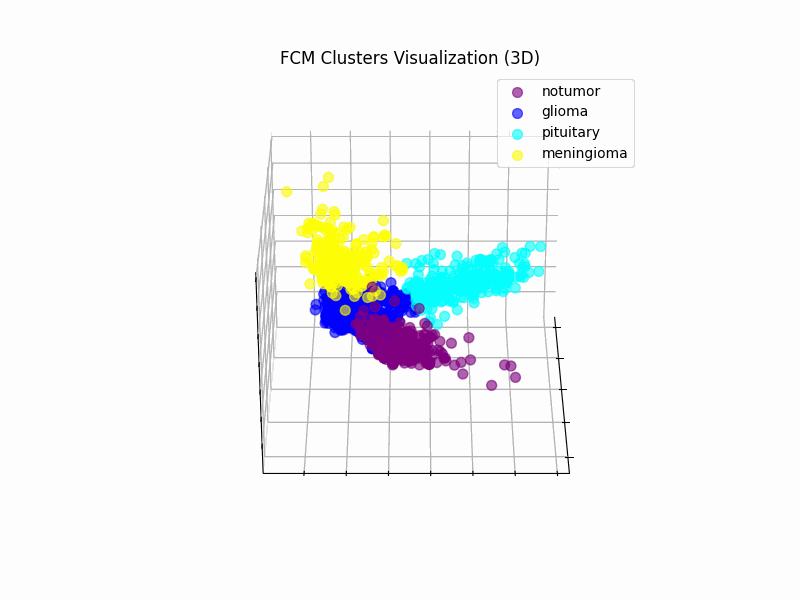

In [8]:
from IPython.display import Image
Image(filename='fcm_3d_clustering.gif')